<a href="https://colab.research.google.com/github/Abhijeethvs/EDA-on-Global-Terrorism/blob/main/E_D_A_on_Global_Terrorism_dataset_by_Abhijeeth_VS_03_06_23.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project Title: Global Terrorism Exploratory Data Analysis (EDA)**

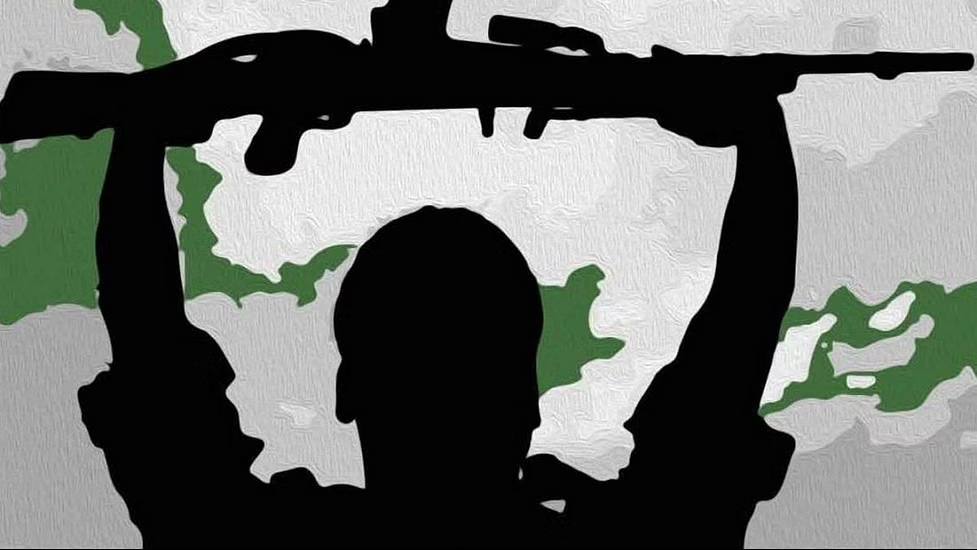

### **Project Description:**

The Global Terrorism Exploratory Data Analysis (EDA) project aims to analyze and explore a comprehensive dataset on global terrorism, with the objective of gaining insights into patterns, trends, and factors associated with terrorist activities worldwide. The project will be hosted on GitHub, providing a collaborative platform for researchers, data analysts, and enthusiasts to contribute, discuss, and enhance our understanding of this critical issue.

The primary goals of this project are:

**Dataset Exploration:** The project will involve thorough exploration of a rich dataset containing information on terrorist incidents, including date, location, attack type, target, casualties, and other relevant attributes. Exploratory data analysis techniques will be employed to identify meaningful patterns, correlations, and trends within the dataset.

**Visualizations:** Interactive and visually appealing data visualizations will be developed to present the findings of the analysis effectively. These visual representations will enable users to comprehend and interpret the complex data effortlessly, facilitating deeper insights into the patterns and dynamics of global terrorism.

**Temporal and Spatial Analysis:** The project will focus on analyzing the temporal and spatial aspects of global terrorism. Patterns in the frequency and intensity of attacks over time and across different regions will be examined to identify potential hotspots, trends, and shifts in terrorist activities.

**Collaborative Platform:** GitHub will serve as a collaborative platform for individuals passionate about combating terrorism. It will encourage discussions, sharing of ideas, and collaborative analysis, fostering a vibrant community of researchers, analysts, and experts working together to enhance our understanding of global terrorism.

**Github link** - https://github.com/Abhijeethvs/EDA-on-Global-Terrorism/tree/main

### **Importing project related python libraries -**

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
%matplotlib inline
import math
from wordcloud import WordCloud

### **Importing the csv file and understanding basic DataSet specifications** -

In [4]:
#Mounting Google Drive -
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
#Importing the csv file by pandas -
filepath = '/content/drive/MyDrive/Almabetter assignments/databases/Global_Terrorism_Data.csv' 
gt_df = pd.read_csv(filepath, low_memory = False)
gt_df.head()

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,1.970000e+11,1970,7,2,NaN,0,NaN,58,Dominican Republic,2,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
1,1.970000e+11,1970,0,0,NaN,0,NaN,130,Mexico,1,...,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN
2,1.970010e+11,1970,1,0,NaN,0,NaN,160,Philippines,5,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
3,1.970010e+11,1970,1,0,NaN,0,NaN,78,Greece,8,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
4,1.970010e+11,1970,1,0,NaN,0,NaN,101,Japan,4,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN


In [6]:
#Shape of the dataset - 
gt_df.shape

(181691, 135)

In [7]:
gt_df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
eventid,181691.0,2.002704e+11,1.325955e+09,1.970000e+11,1.991020e+11,2.009020e+11,2.014080e+11,2.017120e+11
iyear,181691.0,2.002639e+03,1.325943e+01,1.970000e+03,1.991000e+03,2.009000e+03,2.014000e+03,2.017000e+03
imonth,181691.0,6.467277e+00,3.388303e+00,0.000000e+00,4.000000e+00,6.000000e+00,9.000000e+00,1.200000e+01
iday,181691.0,1.550564e+01,8.814045e+00,0.000000e+00,8.000000e+00,1.500000e+01,2.300000e+01,3.100000e+01
extended,181691.0,4.534622e-02,2.080629e-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
...,...,...,...,...,...,...,...,...
nreleased,10400.0,-2.901827e+01,6.572012e+01,-9.900000e+01,-9.900000e+01,0.000000e+00,1.000000e+00,2.769000e+03
INT_LOG,181691.0,-4.543731e+00,4.543547e+00,-9.000000e+00,-9.000000e+00,-9.000000e+00,0.000000e+00,1.000000e+00
INT_IDEO,181691.0,-4.464398e+00,4.637152e+00,-9.000000e+00,-9.000000e+00,-9.000000e+00,0.000000e+00,1.000000e+00
INT_MISC,181691.0,9.000996e-02,5.684573e-01,-9.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00


### **Checking Dataset for Missing values** - 

In [8]:
#Finding the percentage of missing values columns wise - 

missingvalues_percentage = gt_df.isna().sum().sort_values(ascending= False)/len(gt_df)
missingvalues_percentage

gsubname3           0.999890
weapsubtype4_txt    0.999615
weapsubtype4        0.999615
weaptype4           0.999598
weaptype4_txt       0.999598
                      ...   
suicide             0.000000
success             0.000000
crit3               0.000000
property            0.000000
eventid             0.000000
Length: 135, dtype: float64

### **Performing Data Cleaning operations to eliminate columns with more than 15% Nan Values** - 

In [9]:
# Finding the columns that have more than 15% missing values
drop_columns_list = list(missingvalues_percentage[missingvalues_percentage>0.15].index.values)

In [10]:
# Dropping the Missing value columns from the data set
gt_df.drop(drop_columns_list,inplace=True,axis=1)
gt_df.columns

Index(['eventid', 'iyear', 'imonth', 'iday', 'extended', 'country',
       'country_txt', 'region', 'region_txt', 'provstate', 'city', 'latitude',
       'longitude', 'specificity', 'vicinity', 'crit1', 'crit2', 'crit3',
       'doubtterr', 'multiple', 'success', 'suicide', 'attacktype1',
       'attacktype1_txt', 'targtype1', 'targtype1_txt', 'targsubtype1',
       'targsubtype1_txt', 'target1', 'natlty1', 'natlty1_txt', 'gname',
       'guncertain1', 'individual', 'weaptype1', 'weaptype1_txt',
       'weapsubtype1', 'weapsubtype1_txt', 'nkill', 'nwound', 'property',
       'ishostkid', 'dbsource', 'INT_LOG', 'INT_IDEO', 'INT_MISC', 'INT_ANY'],
      dtype='object')

In [11]:
gt_df.shape

(181691, 47)

In [12]:
# Exploring the remaining columns data for missing values
missingvalues_percentage = gt_df.isna().sum().sort_values(ascending= False)/len(gt_df) #To get the percentage of null values each column wise
missingvalues_percentage*100

weapsubtype1        11.430396
weapsubtype1_txt    11.430396
nwound               8.977330
targsubtype1_txt     5.709144
targsubtype1         5.709144
nkill                5.676120
longitude            2.508104
latitude             2.507554
natlty1              0.858050
natlty1_txt          0.858050
target1              0.350045
city                 0.238867
provstate            0.231712
guncertain1          0.209146
ishostkid            0.097969
specificity          0.003302
doubtterr            0.000550
multiple             0.000550
individual           0.000000
INT_MISC             0.000000
gname                0.000000
weaptype1_txt        0.000000
weaptype1            0.000000
property             0.000000
INT_IDEO             0.000000
INT_LOG              0.000000
dbsource             0.000000
eventid              0.000000
attacktype1_txt      0.000000
targtype1_txt        0.000000
targtype1            0.000000
imonth               0.000000
iday                 0.000000
extended  

In [13]:
gt_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181691 entries, 0 to 181690
Data columns (total 47 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   eventid           181691 non-null  float64
 1   iyear             181691 non-null  int64  
 2   imonth            181691 non-null  int64  
 3   iday              181691 non-null  int64  
 4   extended          181691 non-null  int64  
 5   country           181691 non-null  int64  
 6   country_txt       181691 non-null  object 
 7   region            181691 non-null  int64  
 8   region_txt        181691 non-null  object 
 9   provstate         181270 non-null  object 
 10  city              181257 non-null  object 
 11  latitude          177135 non-null  float64
 12  longitude         177134 non-null  float64
 13  specificity       181685 non-null  float64
 14  vicinity          181691 non-null  int64  
 15  crit1             181691 non-null  int64  
 16  crit2             18

### **Renaming columns for ease of data analysis** - 

In [14]:
gt_df.rename(columns={
                      'iyear':'Year','imonth':'Month','country_txt':'Country',
                      'region_txt':'Region','provstate':'State','city':'City',
                      'latitude':'latitude','longitude':'longitude','success':'Success',
                     'attacktype1_txt':'Attacktype','targtype1_txt':'Target_type',
                      'targsubtype1_txt':'Target_subtype','gname':'Group_name',
                      'weaptype1_txt':'Weapontype','nkill':'Kills', 'nwound':'Wounds'
                      },inplace=True)
gt_df.columns

Index(['eventid', 'Year', 'Month', 'iday', 'extended', 'country', 'Country',
       'region', 'Region', 'State', 'City', 'latitude', 'longitude',
       'specificity', 'vicinity', 'crit1', 'crit2', 'crit3', 'doubtterr',
       'multiple', 'Success', 'suicide', 'attacktype1', 'Attacktype',
       'targtype1', 'Target_type', 'targsubtype1', 'Target_subtype', 'target1',
       'natlty1', 'natlty1_txt', 'Group_name', 'guncertain1', 'individual',
       'weaptype1', 'Weapontype', 'weapsubtype1', 'weapsubtype1_txt', 'Kills',
       'Wounds', 'property', 'ishostkid', 'dbsource', 'INT_LOG', 'INT_IDEO',
       'INT_MISC', 'INT_ANY'],
      dtype='object')

### **Filling NaN Values respectively using Pandas fillna method call** - 

In [15]:
gt_df['State']= gt_df['State'].fillna('Unknown')
gt_df['City']=gt_df['City'].fillna('Unknown')
gt_df['Target_type']= gt_df['Target_type'].fillna("Others")
gt_df['Kills']=gt_df['Kills'].fillna(0)
gt_df['Wounds']=gt_df['Wounds'].fillna(0)
gt_df['victims']=gt_df['Kills']+gt_df['Wounds']

## **1.General Analysis of DataSet**- 

### **1.1 Project description**

In [16]:
print("Country with most attacks: ",gt_df["Country"].value_counts().idxmax())
print("City with most attacks: ",gt_df["City"].value_counts().index[1])
print("Region with most attacks: ",gt_df["Region"].value_counts().idxmax())
print("Year with most attacks: ",gt_df["Year"].value_counts().idxmax())
print("Month with most attacks: ",gt_df["Month"].value_counts().idxmax())
print("Group with most attacks: ",gt_df["Group_name"].value_counts().index[1])
print("Most Attack Types: ",gt_df["Attacktype"].value_counts().idxmax())

Country with most attacks:  Iraq
City with most attacks:  Baghdad
Region with most attacks:  Middle East & North Africa
Year with most attacks:  2014
Month with most attacks:  5
Group with most attacks:  Taliban
Most Attack Types:  Bombing/Explosion


### **1.2 Analysis of countries most affected by terrorist attacks in the world from 1970 - 2017**

In [17]:
# Code - 
grp = gt_df.groupby('Country')
tot_ser = grp['Success'].sum()
tot_attack = pd.DataFrame(tot_ser).reset_index()
tot_attack.sort_values(by = 'Success',ascending = False, inplace = True)
tot_attack = tot_attack.head(30)

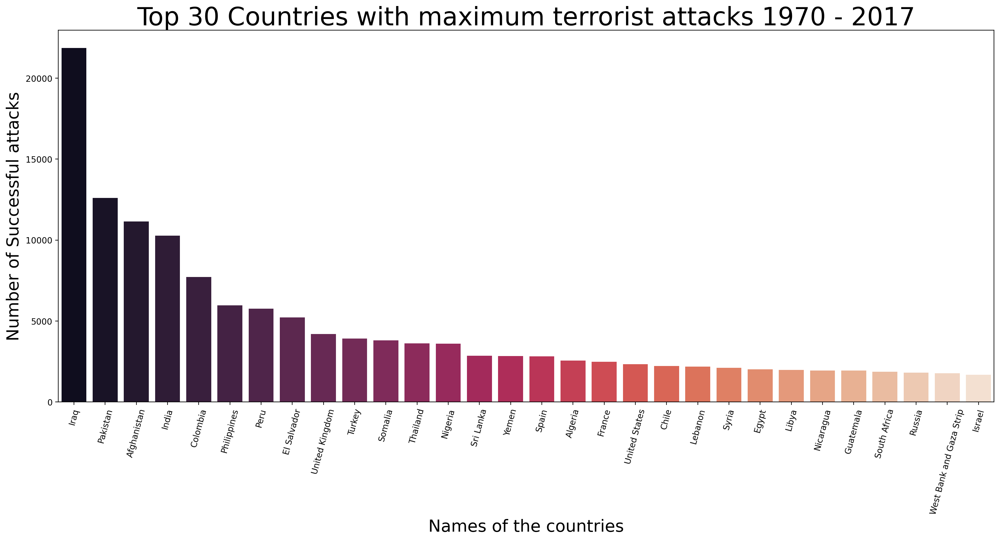

In [18]:
# Visual - 
plt.figure(figsize = (20,8),dpi = 200)

a = sns.barplot(data = tot_attack, x = 'Country', y = 'Success', palette = 'rocket')

plt.xticks(rotation=75)
plt.rc('xtick', labelsize=18)
plt.rc('ytick', labelsize=13)

a.set_title('Top 30 Countries with maximum terrorist attacks 1970 - 2017', fontsize = 30)
a.set_ylabel('Number of Successful attacks', fontsize = 20)
a.set_xlabel('Names of the countries', fontsize = 20)
plt.show()

In [19]:
count4 = tot_attack.head(6).reset_index().drop('index', axis = 1)
count4.index+=1
count4

,Country,Success
1,Iraq,21861
2,Pakistan,12600
3,Afghanistan,11141
4,India,10280
5,Colombia,7712
6,Philippines,5975


### **Visualisation insight** - 
The statistics of the Bar plot provides us with a quick and easy representation of the overall Terrorist attacks carried out by all Terror outfits combined during the time period from **1970 to 2017**. 

Based on the plot above some of the statistics that can be determined include -

1. **Iraq** with 21861 attacks, **Pakistan** with 12600 attacks & **Afghanistan** with 11141 attacks respectively, are the top three contries affected by most number of terrorist attacks globally.

2. **India** closely follows with 10280 attacks at the fourth spot for the most number of terrorist attacks globally.

Based on the above outline insight we can understand the magnitude of attacks worldwide, and provide a more detailed Exploratory Data Analysis on the countries that are a hotspot for Terror activities.

## **2. TERROR TREND ANALYSIS** -

### **2.1 Overall terror trend lineplot** - 

In [20]:
#Code - 

year_grp = gt_df.groupby('Year')
count_year = pd.DataFrame(year_grp['Success'].sum()).reset_index()
failed = gt_df[gt_df['Success'] == 0]
failed_df = pd.DataFrame(failed['Year'].value_counts().reset_index())
failed_df.columns = ['Year','Failures']
failed_df.sort_values(by = 'Year', ascending = True, inplace = True)

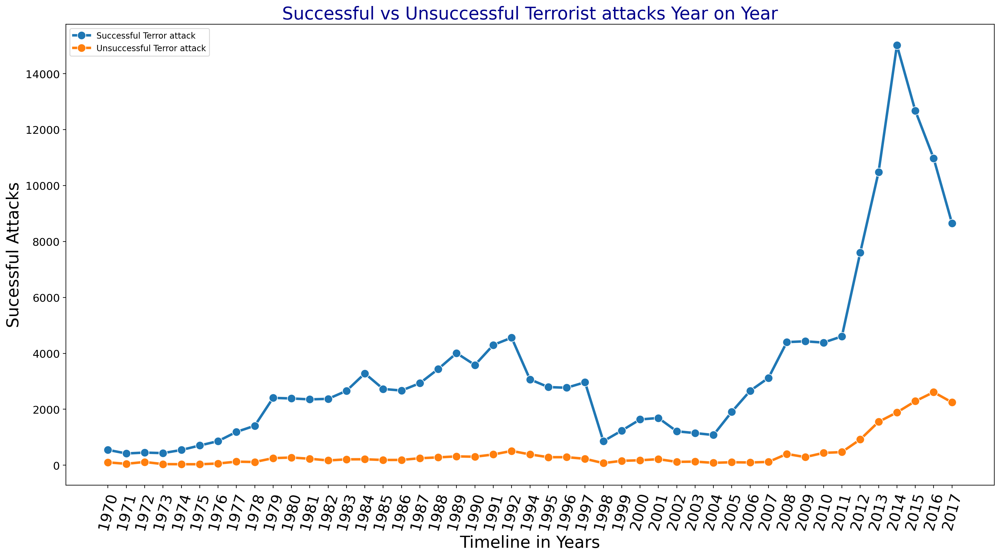

In [21]:
# Visual - 

# Line plot representing the Year Vs no of Attacks Regional wise
plt.figure(figsize = (20,10),dpi = 200)
sns.lineplot(data = count_year, x = count_year['Year'].astype(str),
             y = count_year['Success'], linewidth = 3,label = 'Successful Terror attack', 
             marker = 'o',markersize = 10)
sns.lineplot(data = failed_df , x = failed_df['Year'].astype(str), y = failed_df['Failures'],
             linewidth = 3, label = 'Unsuccessful Terror attack', marker = 'o',markersize = 10)
plt.ylabel('Sucessful Attacks',fontsize= 20)
plt.xlabel("Timeline in Years",fontsize= 20)
plt.xticks(rotation = 75)
plt.yticks(fontsize = 13)
plt.title("Successful vs Unsuccessful Terrorist attacks Year on Year",fontsize=21,color='Darkblue')

plt.show()

### **Visualisation insight** - 

The above plot indicates a more detailed apprach with a lineplot that indicates the progression of time along the 'X' axis and signifies the count of number of attacks along the 'Y' axis.

The blue plot line indicates number of successful attacks and the orange line indicates the number of unsuccessful attacks.

The following inference can be obtained from the above plot - 
1. From the plot above it can be understood there were two significant time periods where a tremendous **increase/spike** in terrorist attacks which were recorded, they were in the years **1992 and 2014**.

2. The least terrorist attacks were observed in the years **1973, 1998 and 2004**.

3. The highest number of unsuccessful attacks were recorded in the year **2016** with about 2300 attacks, However this information does not indicate an increase in success ratio of any intelligence/military agencies.  

### **2.2 Terror Analysis for the year 1992** - 

#### Based on the observations of **Terror trend analysis** in the previous section, the spike of terror incidents for the year **1992** was explored further.

In [22]:
#Code - 
df_1992 = pd.DataFrame(year_grp.get_group(1992)[['Region','Group_name']].value_counts().reset_index())
df_1992.columns = ['Region','Group_name','Number of attacks']
top10_1992 = df_1992.sort_values(by = 'Number of attacks', ascending = False).head(10)
top10_1992_bar = pd.DataFrame(top10_1992.groupby('Region')['Number of attacks'].sum()).reset_index()

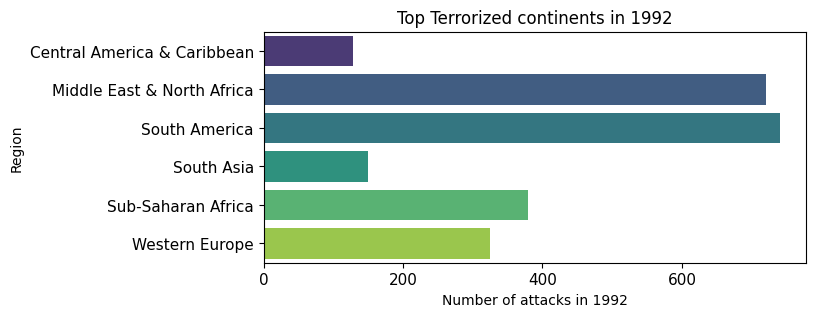

In [23]:
#Visual - 
#SunBurst plot Code - 
figA = px.sunburst(top10_1992,values='Number of attacks',
                   path=['Region','Group_name','Number of attacks'],
                   color_discrete_sequence=px.colors.qualitative.Dark24_r,
                   title='Top Continents affected by terrorist attacks in 1992')
figA.show()

#Barplot Code - 
plt.figure(figsize = (7,3))
sns.barplot(data = top10_1992_bar, x = 'Number of attacks', y = 'Region',palette = 'viridis')
plt.xlabel('Number of attacks in 1992')
plt.title('Top Terrorized continents in 1992')
plt.xticks(fontsize = 11)
plt.yticks(fontsize = 11)
plt.show()

### **Visualisation insight** - 
From the above Sunburst plot and Bar plot it is evident that the top countries that were most affected by terrorist attacks in the year **1992** are -

1. South America - **741 attacks**, Most active terrorist group - **Shining path(SL)** 

2. Middle East and North Africa - **721 attacks**, Most active terrorist group - **Kurdistan workers party(PKK)**.
3. Sub-Saharan Africa - **379 attacks**, Most active terrorist group - **Unknown**.

**NOTE -** The labels 'Unknown' indicates either data unavailable or the attacks are not being claimed by any terrorist/extremist organisations.

### **2.2 Terror Analysis for the year 2014** -

#### Based on the observations of **Terror trend analysis** in the previous section, the spike of terror incidents for the year **2014** was explored further.

In [24]:
#Code - 
df_2014 = pd.DataFrame(year_grp.get_group(2014)[['Region','Group_name']].value_counts().reset_index())
df_2014.columns = ['Region','Group_name','Number of attacks']
top10_2014 = df_2014.sort_values(by = 'Number of attacks', ascending = False).head(10)
top10_2014_bar = pd.DataFrame(top10_2014.groupby('Region')['Number of attacks'].sum()).reset_index()

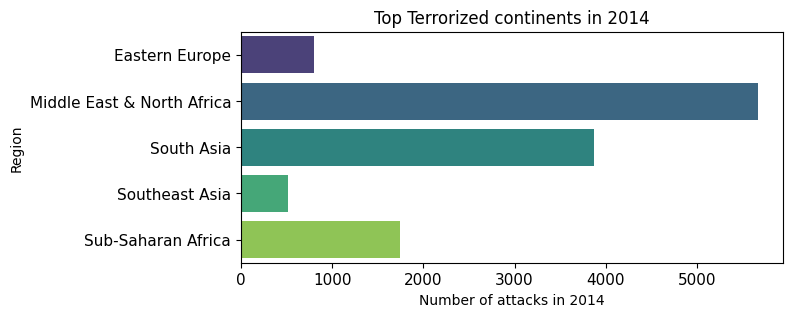

In [25]:
#Visual -
#Sunburst plot Code-

figB = px.sunburst(top10_2014,values='Number of attacks',
                       path=['Region','Group_name','Number of attacks'],
                       color_discrete_sequence=px.colors.qualitative.Prism,
                       title='Top Continents affected by terrorist attacks in 2014')
figB.show()



#Barplot Code-
plt.figure(figsize = (7,3))
sns.barplot(data = top10_2014_bar, x = 'Number of attacks', y = 'Region',palette = 'viridis')
plt.xlabel('Number of attacks in 2014')
plt.title('Top Terrorized continents in 2014')
plt.xticks(fontsize = 11)
plt.yticks(fontsize = 11)

plt.show()

### **Visualisation insight** - 
From the above Sunburst plot and Bar plot it is evident that the top countries that were most affected by terrorist attacks in the year **2014** are -

1. Middle East and North Africa - **5664 attacks**, Most active terrorist group - **Islamic State of Iraq and the Levant - (I.S.I.L).**
2. South Asia - **3866 attacks**, Most active terrorist group - **Taliban**.
3. Sub-Saharan Africa - **1748 attacks**, Most active terrorist group - **AL-Shabaab**.

### **Section Conclusions -**

The insights which can be arrived at by the observations of the spike in **1992** and the spike in **2014** are - 
1. With the advancement of technology and civilization there is a positive correlation in the rise of terrorist activities recorded worldwide.
2. **Middle East and North Africa** remains as the hub for terror activities in both the spikes observed.
3. Number of terrorist attacks have increased in the South Asian region in the year **2014** in comparison to the observations recorded in the **1992** spike. 
4. Many new Terror outfits have replaced the earlier organisations signifying new entrants of terrorist organisations.

**NOTE -** The labels 'Unknown' indicates either data unavailable or the attacks are not being claimed by any terrorist/extremist organisations.

### **2.3 Wordcloud -** 

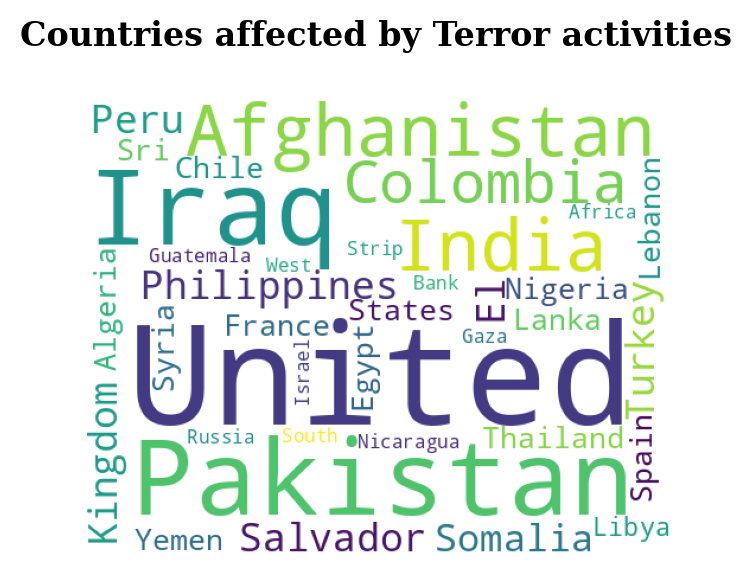

In [26]:
#Code - 
cities = tot_attack['Country']
plt.subplots(figsize=(4,3),dpi = 200)
wordcloud= WordCloud(background_color='White',
                     width=500,
                     height=390).generate(' '.join(cities))
plt.axis('off')
plt.imshow(wordcloud)
plt.title('Countries affected by Terror activities\n',
          fontdict={'family':'serif','color':'black','weight':'bold','size':12})
plt.show()

### **Visualisation insight** - 
Word cloud indicates all the different countries affected worldwide by the horror of terrorism.




In [191]:
#Sub-setting Main DataSet for location analysis - 
 
location_df = gt_df[['Year','Country','Region','State','City','latitude','longitude']]

## **3.Demographical analysis of the World and top 3 countries most affected by terrorist activties -**

### **3.01 WORLD-WIDE TERROR ANALYSIS -** 

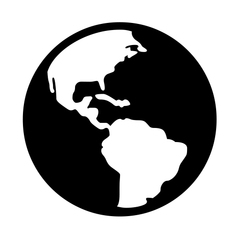

In [192]:
#Code-
world_loc_df = location_df.dropna(how = 'any')
world_states = pd.DataFrame(world_loc_df['State'].value_counts().reset_index())
world_states.columns= ['State','Attacks']

world_states = world_states.head(5)

mask_w = pd.DataFrame(world_loc_df[['Year','State']].value_counts().reset_index())
mask_w.columns = ['Year','State','Attacks']
list_of_top = ['Baghdad','Northern Ireland','Al Anbar','Balochistan','Saladin']
mask_w = mask_w[mask_w.State.isin(list_of_top)]

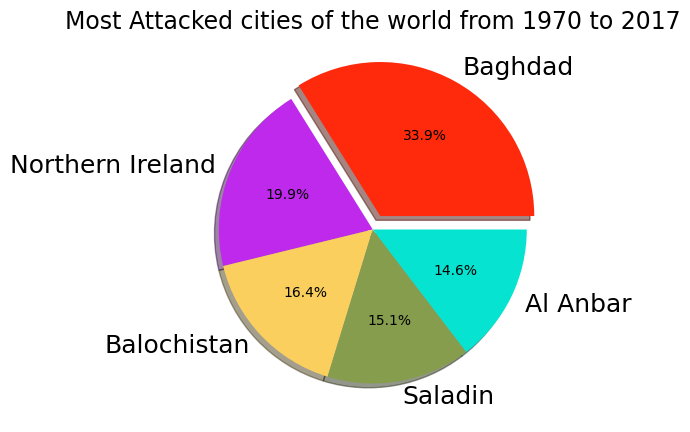

In [193]:
#Pieplot code - 

plt.figure(figsize=(5,5))
df = world_states['Attacks']
explode = (0.1,0,0,0,0)
colors = ['#ff2a0c','#be29ec','#facf5e','#869d4d','#06e4d1']
plt.pie(df, labels=world_states['State'], autopct='%1.1f%%',explode = explode,shadow = True, colors = colors)
plt.title("Most Attacked cities of the world from 1970 to 2017",fontsize=17,color='Black')
plt.show()

In [194]:
world_states.index += 1
world_states

,State,Attacks
1,Baghdad,7645
2,Northern Ireland,4497
3,Balochistan,3710
4,Saladin,3411
5,Al Anbar,3299


### **Visualisation insight -**
The above Pie plot attempts to provide a visual insight of the different percentages of impact of terrorist activities on the most terrorised cities of  the world for the time period **1970 to 2017** -

From the above plot we can infer -

1. **Baghdad** with **7645 attacks**, is the most formidable city for terrorist attacks in the world.
2. **Northern Ireland** with **4497 attacks**, ranks second in the world.
3. **Balochistan** with **3710 attacks**, ranks third in the world.
4. **Saladin** with **3411 attacks**, ranks fourth in the world.
5. **Al Anbar** with **3299 attacks**, ranks fifth in the world.

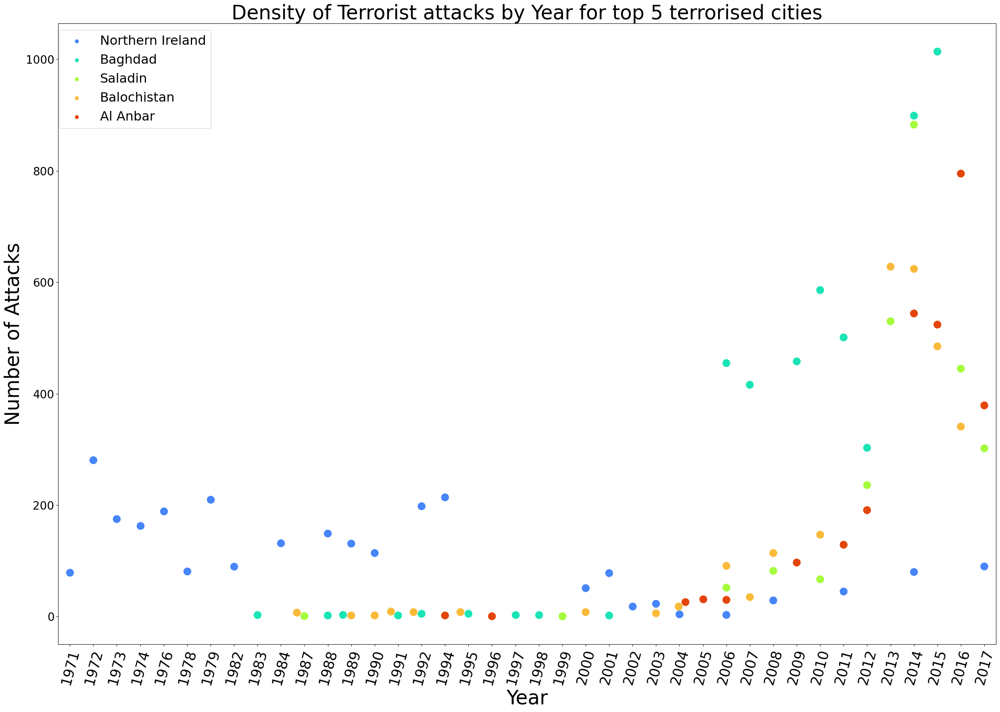

In [195]:
#Visual 2 - 

#Swarmplot code - 
plt.figure(figsize = (30,20))
sns.swarmplot(data = mask_w.sample(80), x = 'Year',y = 'Attacks',hue = 'State',size = 14,palette = 'turbo')
plt.xticks(rotation = 75, fontsize = 25)
plt.yticks(fontsize = 20)
plt.xlabel('Year',fontsize = 35)
plt.ylabel('Number of Attacks',fontsize = 35)
plt.title('Density of Terrorist attacks by Year for top 5 terrorised cities',fontsize = 35)
plt.legend(bbox_to_anchor = (0.17,1),fontsize = 23)
plt.show()

### **Visualisation insight -**
The above Swarm plot attempts to provide a more detailed visual insight on the terrorist attacks on top 5 terrorised cities of the world individually for the respective years from 1970 to 2017-
This plot merely attempts to demonstrate the density of the terror attacks

From the above plot we can observe -

1. There were about 150 - 200 attacks every year from **1975 to 2002.**

2. A cooldown period in terrorist activities was seen from **1996 to 2001** worldwide, where the attacks seemed to have reduced to approximately **50 attacks.**

3. A significant exponential increase in terrorist activities were recorded from **2004**, with approximately 800 to 1000 known & recorded attacks taking place in the top 5 terrorised cities of the world happening in between years **2012 to 2014**.

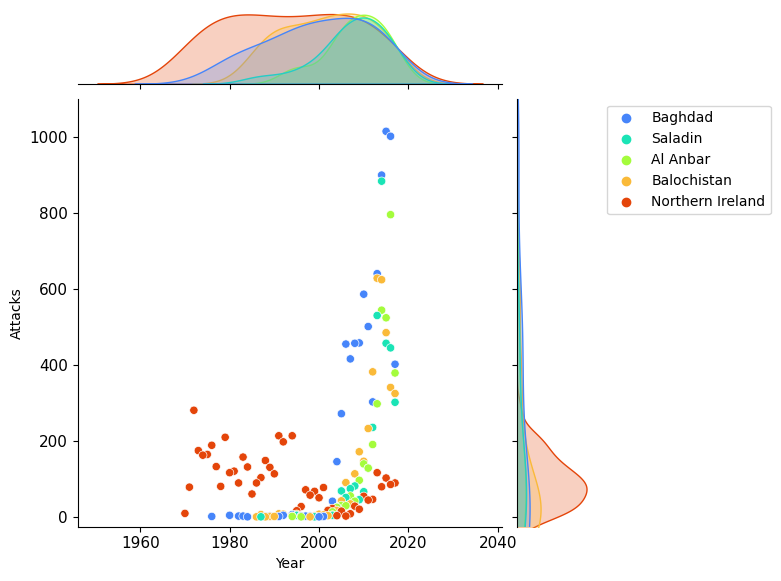

In [196]:
#Visual 3-

#Jointplot code - 
sns.jointplot(data = mask_w,x = 'Year',y = 'Attacks',hue = 'State', palette = 'turbo')
plt.ylim(-25,1100)
plt.legend(bbox_to_anchor = (1.65,1),fontsize =10)
plt.xticks(fontsize = 11)
plt.yticks(fontsize = 11)
plt.show()

### **Visualisation insight** - 
The above Joint plot attempts to provide a detailed visual insight on the terrorist attacks on the top 5 terrorised cities of the world for the respective years from 1970 to 2017, the observations are of similar in representation to that of the swarm plot, with an additional Kernel Denstiy Estimation Curve plotted for more visual overview on the distribution of attacks.

From the above plot we can observe -

1. From the years **1972 to 1994** - **Northern Ireland** remained the most terrorised city in the world with approximately 200 terrorist attacks taking place every year, the attack rate on Northern Ireland seemed to be on a decline post 1994 in comparison to other cities of the world.

2. The city of **Baghdad** which had very negligible terrorist activities until 2004 saw an exponential increase in terror activities since, and reached its peak with more than **1000 terrorist activities in 2016** crowning it as the most terrorised state in the world.

3. **Balochistan, Saladin** and **Al Anbar** also witness a terrorism activity uptrend with similarity to Baghdad since the year 2006, reaching a peak figures of 800 to 1000 attacks every year.

## **3.01.1 Analysis of terrorist activities in the World :**

In [197]:
#Creating custom function to tabulate attack failures - 
def failure_count(num):
    if num == 0:
        return 1
    else:
        return 0

In [198]:
#Code - 
var = gt_df
attack_group_w = var[['Year','Month','iday','Success','Group_name']]

attack_group_w.insert(loc = 4, column = 'Failure',value = attack_group_w['Success'].apply(failure_count))
overall = pd.pivot_table(data = attack_group_w,index = 'Group_name',values = ['Success','Failure'],aggfunc = np.sum)
overall['Total_attacks'] = overall['Failure']+overall['Success']
overall['Success_rate'] = round((overall['Success']/overall['Total_attacks'])*100,2)

overall_top10 = overall.nlargest(n = 11, columns= 'Total_attacks')
overall_top10 = overall_top10.drop('Unknown',axis = 0)

overall_top5 = overall_top10.nlargest(5,columns= 'Total_attacks')
top5gang = overall_top5.reset_index()['Group_name']

In [199]:
overall_top10

,Failure,Success,Total_attacks,Success_rate
Group_name,,,,
Taliban,798,6680,7478,89.33
Islamic State of Iraq and the Levant (ISIL),854,4759,5613,84.79
Shining Path (SL),218,4337,4555,95.21
Farabundo Marti National Liberation Front (FMLN),34,3317,3351,98.99
Al-Shabaab,272,3016,3288,91.73
New People's Army (NPA),315,2457,2772,88.64
Irish Republican Army (IRA),389,2282,2671,85.44
Revolutionary Armed Forces of Colombia (FARC),185,2302,2487,92.56
Boko Haram,171,2247,2418,92.93


### **DataFrame insight -**
The above DataFrame provides a **Leaderboard of the top 10 terrorist organisations** perpeterating the most terrorist attacks in the World and their respective success rates -

The following rankings for the organisations is provided based on the number of Successful terrorist attacks committed worldwide overall.

1. **Taliban**  - With 6680 successful attacks and a success rate of 89.33%, Taliban ranks No.1 in the World as the most notorious terrorist organisation.

2. **Islamic State of Iraq and the Levant (ISIL)** - 4759 successful attacks with a success rate of 84.79%, ISIL ranks No.2 in the world.

3. **Shining Path (SL)** - 4337 successful attacks with a success rate of 95.21%, SL ranks No.3 in the world.

4. **Farabundo Marti National Liberation Front (FMLN)** - 3317 successful attacks with a success rate of 98.99%, FMLN ranks No.4 in the world.

**NOTE** - A large number of labels were indicated as 'Unknown' which either means data is unavailable, or the attacks are not being claimed by any terrorist/extremist organisations, the related data has been excluded from the analysis.

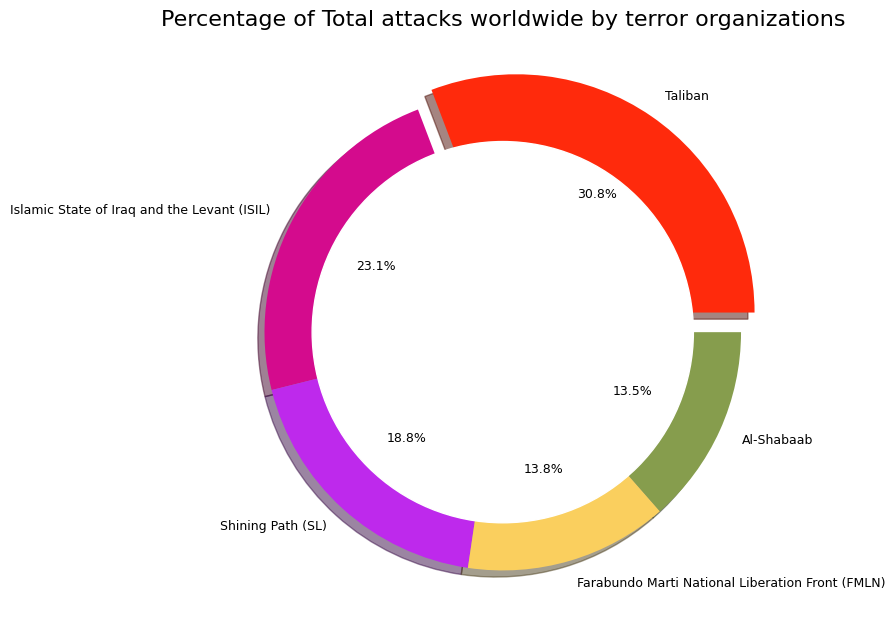

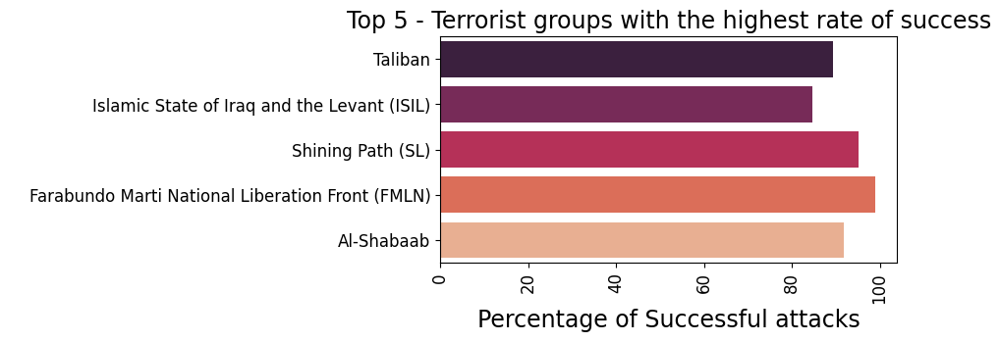

In [200]:
#Visual - 

#Pieplot code - 

df = overall_top5['Total_attacks']
explode = (0.1, 0,0, 0,0) 
colors = ['#ff2a0c','#d40b8d','#be29ec','#facf5e','#869d4d','#06e4d1','#283482','#e6ff05','#e1a28e','#00a898']
plt.pie(df, labels=overall_top5.index, autopct='%1.1f%%',explode = explode, shadow = True,colors = colors, radius = 1,textprops={'fontsize': 9})
my_circle = plt.Circle((0,0),0.8,color='white')
p=plt.gcf().gca().add_artist(my_circle)
plt.rcParams['figure.figsize'] = (17,6)
plt.title("Percentage of Total attacks worldwide by terror organizations",fontsize=16,color='Black')
plt.tight_layout()
plt.show()

#Barplot - 
plt.figure(figsize = (6,3))
sns.barplot(data = overall_top5, x = 'Success_rate',y = overall_top5.index, palette = 'rocket')
plt.xticks(rotation = 90, fontsize = 12)
plt.yticks(fontsize = 12)
plt.ylabel(' ')
plt.xlabel('Percentage of Successful attacks', fontsize = 17)
plt.title('Top 5 - Terrorist groups with the highest rate of success', fontsize = 17)
plt.show()

### **Visualisation Insight -**
The above Donut plot and Bar plot, attempt to provide a visual representation of the most active terrorist organisations world-wide and their subsequent success rates respectively.

We can observe that -

1. **Taliban** - has carried out 30.8% of the total terrorist attacks in the world, with a success rate of 89.33%.

2. **Islamic State of Iraq and the Levant (ISIL)**  - has carried out 23.1% of the total terrorist attacks in the world, with a success rate of 84.79%.

3. **Shining Path (SL)** - has carried out 18.8% of the total terrorist attacks in the world, with a success rate of 95.21%.

4. **Farabundo Marti National Liberation Front (FMLN)** - has carried out 13.8% of the total terrorist attacks in the world, with a success rate of 98.99%.

5. **AL-Shabaab** - has carried out 13.5% of the total terrorist attacks in the world, with a success rate of 91.73%.

In [201]:
#Code - 

overall2 = pd.pivot_table(data = attack_group_w,index = ['Group_name','Year'],values = ['Success','Failure'],aggfunc = np.sum)
overall2.reset_index()
overall2.sort_values(by = 'Year',ascending = True, inplace = True)
overall2['Total_attacks'] = overall2['Failure']+overall2['Success']
overall2['Success_rate'] = round((overall2['Success']/overall2['Total_attacks'])*100,2)
overall2.sort_values(by = 'Total_attacks', ascending = False, inplace = True)
overall2 = overall2.reset_index()
overall2 = overall2[overall2['Group_name'].isin(top5gang)]
overall2.sort_values(by = 'Year', ascending = True, inplace = True)

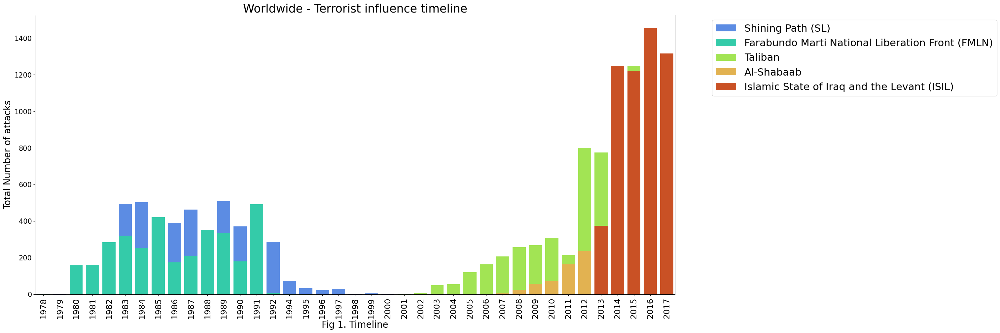

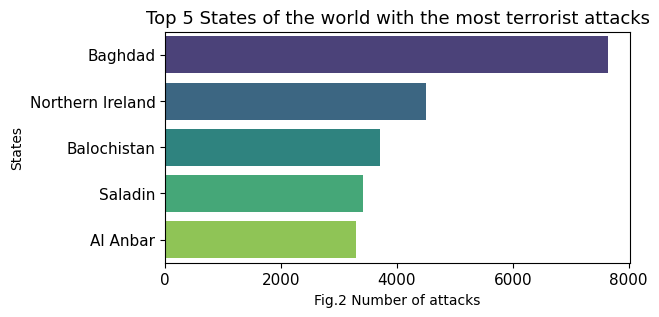

In [202]:
#Visualisation - 

#Barplot code - 
plt.figure(figsize = (25,11))
sns.barplot(data = overall2, x = 'Year',y ='Total_attacks', hue = 'Group_name', dodge = False, palette = 'turbo')
plt.legend(bbox_to_anchor = (1.05,1),fontsize =22)
plt.xticks(rotation = 90)
plt.yticks(fontsize = 15)
plt.title('Worldwide - Terrorist influence timeline',fontsize = 25)
plt.ylabel('Total Number of attacks', fontsize = 20)
plt.xlabel('Fig 1. Timeline',fontsize =20)
plt.show()

#Barplot code - 

plt.figure(figsize = (6,3))
sns.barplot(data = world_states, x = 'Attacks', y = 'State', palette = 'viridis')

plt.title('Top 5 States of the world with the most terrorist attacks',fontsize = 13)
plt.xlabel('Fig.2 Number of attacks')
plt.ylabel('States')
plt.xticks(fontsize = 11)
plt.yticks(fontsize = 11)

plt.show()

### **Visualisation and section Insight -**
The above Fig 1 and Fig 2 , provides a visual representation of total number of attacks carried out by individual terrorist organisations for the years 1970 to 2017 and most attacked cities for the same time period.

We can observe that -

1. During the time period from 1980 - 1992 **Farabundo Marti National Liberation Front (FMLN) and Shining Path (SL)** Terrorised the planet with approximately 400 attacks every year.

2. From 1994 to 2002 saw a decline in **FMLN and SL** terror activities making the number of attakcs almost negligible, although the reason behind the same could not be established from the dataset provided.

3. 2002 - 2003 witnessed the entrant of the Terror organisation **Taliban** who quickly rose to make their mark by exponentially increasing the terror activities around the globe with about 6680 successful terror strikes. 

4. 2013 saw the entrant of the Terror outfit **Islamic State of Iraq and the Levant (ISIL)** who engaged in multiple terror strikes across the globe, with about 4759 successful terror strikes in a short time period between 2013 and 2017 and a success rate of 84.79%,

*In Conclusion, By the current witnessed historic data for the time-period 1970 to 2017, **Taliban** is the most notorious terrorist organisation.* 

*However, Based on the analytics if the same rate ensued **ISIL** could quickly become the N0.1 Terror organisation in the world.*



### **3.1. No.1 Most affected Country - IRAQ** : 

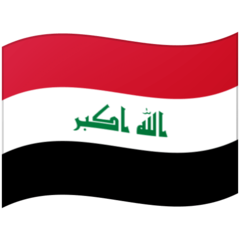

Located in the Middle East, **Iraq** is a country with a diverse landscape and a rich historical and cultural heritage. Here is a general geographical description of **Iraq**:

1. **Borders and Surroundings**:
Iraq is bordered by several countries, including Iran to the east, Kuwait to the southeast, Saudi Arabia to the south, Jordan to the southwest, Syria to the west, and Turkey to the north. To the southeast, Iraq has a coastline along the Persian Gulf.

2. **Topography**:
The topography of Iraq is characterized by a combination of plains, plateaus, and mountain ranges. The Tigris and Euphrates rivers, which flow from the northwest to the southeast, are the major waterways that shape the landscape. 

3. **Plains and Plateaus**:
The northern part of Iraq is predominantly mountainous, with the Zagros Mountains running along the border with Iran.Moving southward, the terrain transitions into broad plains, such as the **Nineveh Plain, the Diyala Plain, and the Dibdiba Plateau**.

4. **Marshes and Wetlands**:
In the southeastern part of the country, near the Iranian border, lie the vast Mesopotamian Marshes. These wetlands, particularly the Central Marshes and the Hammar Marshes, are fed by the Tigris and Euphrates rivers. 

5. **Desert Regions**:
To the west and southwest of the Tigris and Euphrates rivers, stretches the vast Iraqi desert, known as the Arabian Desert.The western part of Iraq includes the **Anbar** province, which is predominantly desert terrain.

6. **Major Cities**:
Iraq's capital city is **Baghdad**, situated along the Tigris River. Other major cities include **Mosul, Basra, Erbil, Sulaymaniyah, Najaf, Karbala, and Kirkuk**. 


In [203]:
#Code - 
Iraq_loc_df = location_df[location_df['Country'] == 'Iraq'].dropna(how = 'any')
iraq_states = pd.DataFrame(Iraq_loc_df['State'].value_counts().reset_index())
iraq_states.columns= ['State','Atacks']

iraq_states = iraq_states.head(5)

mask_i = pd.DataFrame(Iraq_loc_df[['Year','State']].value_counts().reset_index())
mask_i.columns = ['Year','State','Attacks']
list_of_top = ['Baghdad','Saladin','Al Anbar','Nineveh','Diyala']
mask_i = mask_i[mask_i.State.isin(list_of_top)]

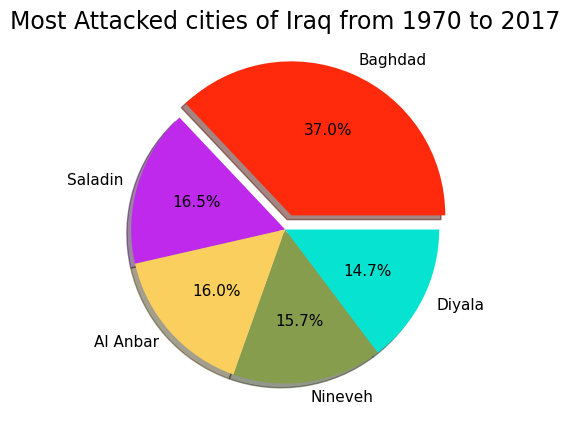

In [204]:
#Visual 1-
#Pieplot code - 

plt.figure(figsize=(5,5))
df = iraq_states['Atacks']
explode = (0.1,0,0,0,0)
colors = ['#ff2a0c','#be29ec','#facf5e','#869d4d','#06e4d1']
plt.pie(df, labels=iraq_states['State'], autopct='%1.1f%%',explode = explode,shadow = True, colors = colors,textprops={'fontsize': 11})
plt.title("Most Attacked cities of Iraq from 1970 to 2017",fontsize=17,color='Black')
plt.show()


### **Visualisation insight** - 
The above Pie plot attempts to provide a visual insight of the different percentage of impact of terrorist activities on different cities of Iraq for the time period **1970 to 2017** - 

From the above plot we can infer - 
1. **Baghdad** with 7644 attacks, is the most favorable city for terrorist attacks.
2. **Saladin** with 3411 attacks, ranks second.
3. **Al Anbar** with 3299 attacks, ranks third.
4. **Nineveh** with 3241 attacks, closely follow **Al-Anbar** and ranks fourth.
5. **Diyala** with 3041 attacks, ranks fifth.

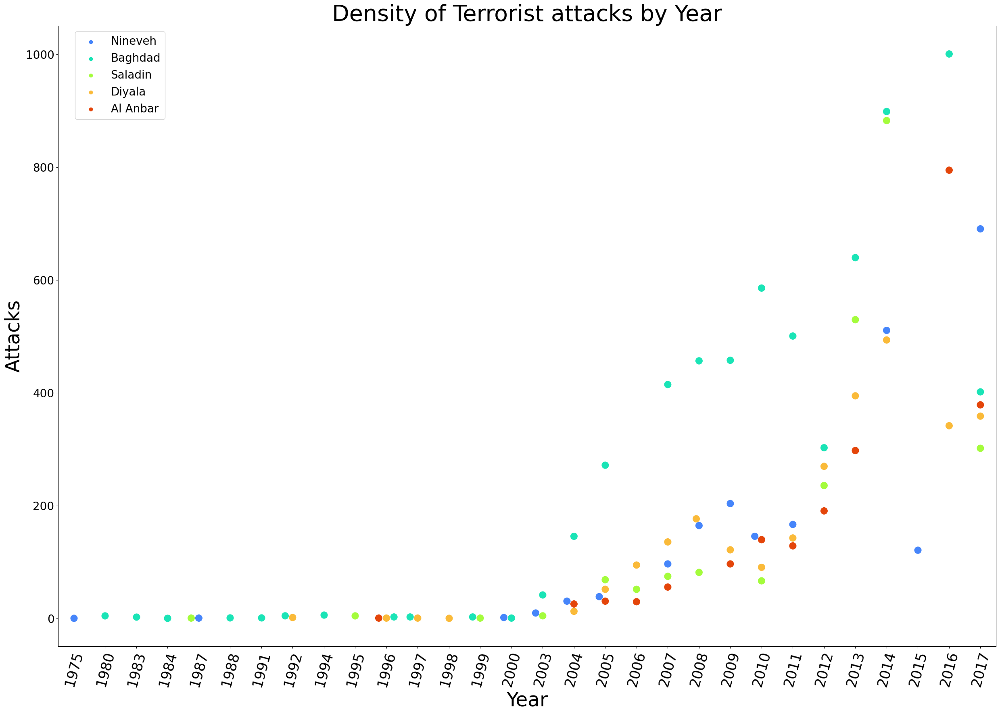

In [205]:
#Visual 2-
#Swarmplot code - 
plt.figure(figsize = (30,20))
sns.swarmplot(data = mask_i.sample(80), x = 'Year',y = 'Attacks', hue = 'State',size = 13,palette = 'turbo')
plt.xticks(rotation = 75, fontsize = 25)
plt.yticks(fontsize = 20)
plt.xlabel('Year',fontsize = 35)
plt.ylabel('Attacks',fontsize = 35)
plt.title('Density of Terrorist attacks by Year',fontsize = 40)
plt.legend(bbox_to_anchor = (0.12,1),fontsize = 20)
plt.show()

### **Visualisation insight -**
The above Swarm plot attempts to provide a more detailed visual insight on the terrorist attacks on different cities of Iraq individually for the respective years from **1970 to 2017**-

From the above plot we can observe -

1. The terrorist attacks were low and varied only slightly for the years **1970 to 2002**.

2. There was an exponential increase in terrorist activities since the beginning of **2003** which marks a significant turn of events.

3. The number of attacks and intensity of attacks on different cities of Iraq have increased tenfold in **2017** as compared with **2003**.



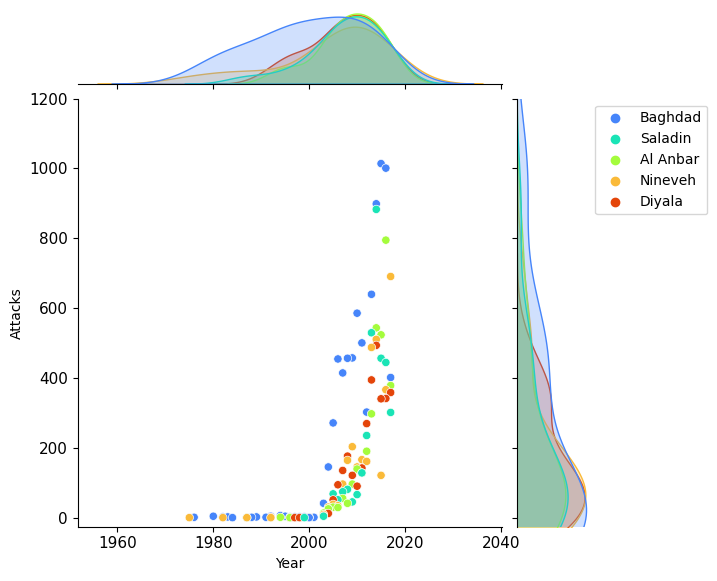

In [206]:
#Visual 3 -

#Jointplot code - 
colors = ['#d40b8d','#be29ec','#facf5e','#869d4d','#06e4d1']
sns.jointplot(data = mask_i,x = 'Year',y = 'Attacks',hue = 'State',palette = 'turbo')
plt.ylim(-25,1200)
plt.legend(bbox_to_anchor = (1.5,1),fontsize =10)
plt.xticks(fontsize = 11)
plt.yticks(fontsize = 11)
plt.show()


### **Visualisation insight -**
The above Joint plot attempts to provide a detailed visual insight on the terrorist attacks on different cities of Iraq individually for the respective years from **1970 to 2017**, the observations are of similar in representation to that of the swarm plot, with an additional Kernel Denstiy Estimation Curve plotted for more visual overview on the distribution of attacks. 

From the above plot we can observe -

1. The terrorist attacks were low and varied only slightly for the years **1970 to 2002**.

2. There was an exponential increase in terrorist activities since the beginning of **2003** which marks a significant turn of events.

3. The number of attacks and intensity of attacks on different cities of Iraq have increased tenfold in **2017** as compared with **2003**.

4. We can observe **Baghdad** being attacked almost every single year since **2002**.

#### **3.1.1 Analysis of terrorist activities in Iraq :**

In [207]:
#Creating custom function to tabulate attack failures - 
def failure_count(num):
    if num == 0:
        return 1
    else:
        return 0

In [208]:
#Code - 
var = gt_df[gt_df['Country'] == 'Iraq']
attack_group = var[['Year','Month','iday','Success','Group_name']]

attack_group.insert(loc = 4, column = 'Failure',value = attack_group['Success'].apply(failure_count))
overall = pd.pivot_table(data = attack_group,index = 'Group_name',values = ['Success','Failure'],aggfunc = np.sum)
overall['Total_attacks'] = overall['Failure']+overall['Success']
overall['Success_rate'] = round((overall['Success']/overall['Total_attacks'])*100,2)

overall_top10 = overall.nlargest(n = 11, columns= 'Total_attacks')
overall_top10 = overall_top10.drop('Unknown',axis = 0)

overall_top5 = overall_top10.nlargest(5,columns= 'Total_attacks')
top5gang = overall_top5.reset_index()['Group_name']


In [209]:
overall_top10

,Failure,Success,Total_attacks,Success_rate
Group_name,,,,
Islamic State of Iraq and the Levant (ISIL),805,3992,4797,83.22
Al-Qaida in Iraq,14,618,632,97.78
Islamic State of Iraq (ISI),5,140,145,96.55
Asa'ib Ahl al-Haqq,1,66,67,98.51
Gunmen,7,50,57,87.72
Tawhid and Jihad,5,44,49,89.80
Al-Naqshabandiya Army,2,33,35,94.29
Muslim extremists,4,28,32,87.50
Ansar al-Islam,2,26,28,92.86


### **DataFrame insight -**

The above DataFrame provides a tabular list of the top 10 terrorist organisations perpeterating the most terrorist attacks in the state of **Iraq** and their respective success rates - 
1. **Islamic State of Iraq and the Levant (ISIL)** - **3992** successful attacks with a success rate of **83.22%**

2. **Al-Qaida in Iraq** - **618** successful attacks with a success rate of **97.78%**

3. **Islamic State of Iraq (ISI)** - **140** successful attacks with a success rate of **96.55%**


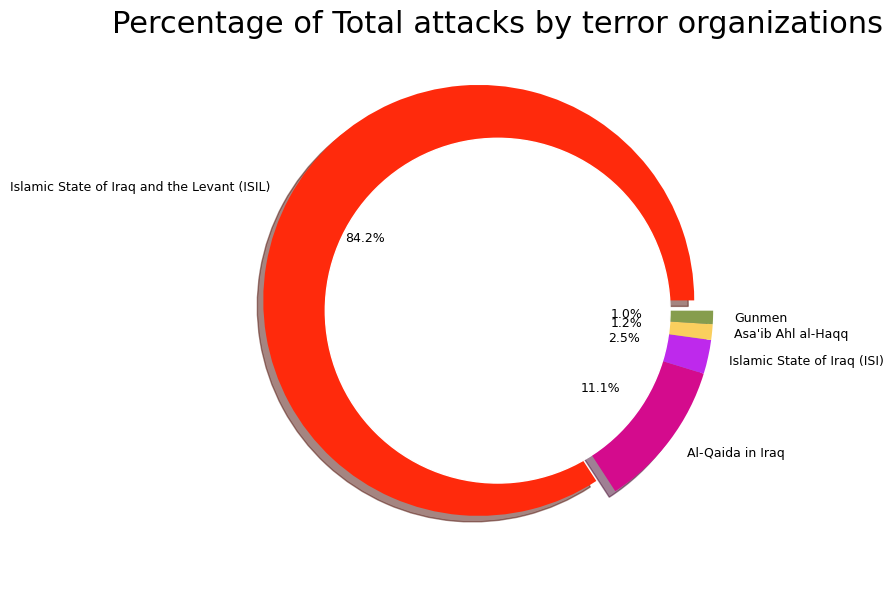

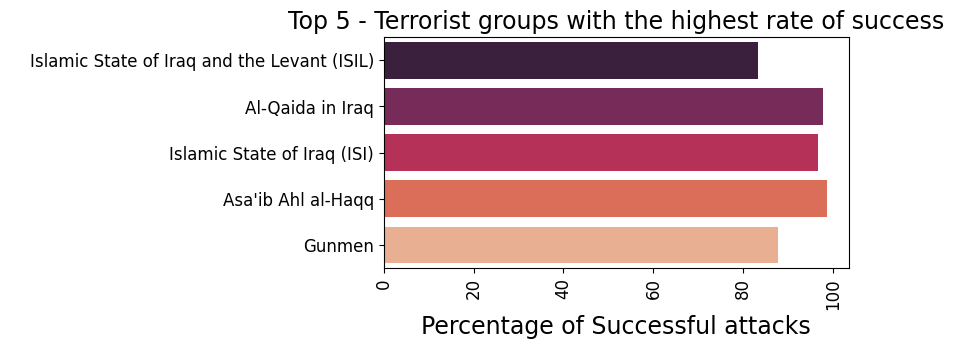

In [210]:
#Visual - 

#Donutplot code - 

df = overall_top5['Total_attacks']
explode = (0.1, 0,0, 0,0) 
colors = ['#ff2a0c','#d40b8d','#be29ec','#facf5e','#869d4d','#06e4d1','#283482','#e6ff05','#e1a28e','#00a898']
plt.pie(df, labels=overall_top5.index, autopct='%1.1f%%',explode = explode, shadow = True,colors = colors, radius = 1,textprops={'fontsize': 9})
my_circle = plt.Circle((0,0),0.8,color='white')
p=plt.gcf().gca().add_artist(my_circle)
plt.rcParams['figure.figsize'] = (17,6.5)
plt.title("Percentage of Total attacks by terror organizations",fontsize=22,color='Black')
plt.tight_layout()
plt.show()

#Barplot - 
plt.figure(figsize = (6,3))
sns.barplot(data = overall_top5, x = 'Success_rate',y = overall_top5.index, palette = 'rocket')
plt.xticks(rotation = 90, fontsize = 12)
plt.yticks(fontsize = 12)
plt.ylabel(' ')
plt.xlabel('Percentage of Successful attacks', fontsize = 17)
plt.title('Top 5 - Terrorist groups with the highest rate of success', fontsize = 17)
plt.show()

### **Visualisation Insight** - 

The above Donut plot and Bar plot, attempt to provide a visual representation of the most active terrorist organisations and their subsequent success rates respectively for the state of Iraq.

We can observe that -

1. **Islamic State of Iraq and the Levant (ISIL)** - has carried out **84%** of the total terrorist attacks in Iraq, with a success rate of **83.22%**.

2. **Al-Qaida in Iraq** - has carried out **11%** of the total terrorist attacks in Iraq, with a success rate of **97.78%**.

3. **Islamic State of Iraq (ISI)** - has carried out **2.5%** of the total terrorist attacks in Iraq, with a success rate of **96.55%**.

In [211]:
#Code - 

overall2 = pd.pivot_table(data = attack_group,index = ['Group_name','Year'],values = ['Success','Failure'],aggfunc = np.sum)
overall2.reset_index()
overall2.sort_values(by = 'Year',ascending = True, inplace = True)
overall2['Total_attacks'] = overall2['Failure']+overall2['Success']
overall2['Success_rate'] = round((overall2['Success']/overall2['Total_attacks'])*100,2)
overall2.sort_values(by = 'Total_attacks', ascending = False, inplace = True)
overall2 = overall2.reset_index()
overall2 = overall2[overall2['Group_name'].isin(top5gang)]
overall2.sort_values(by = 'Year', ascending = True, inplace = True)

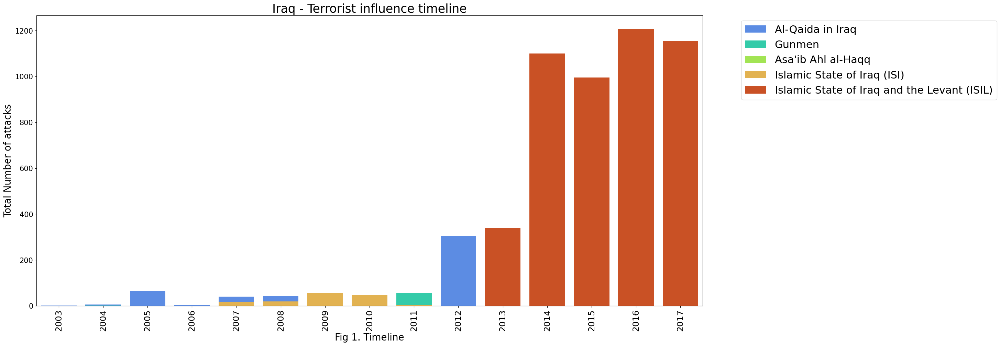

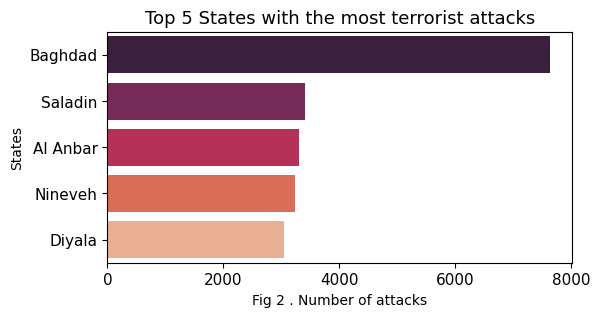

In [212]:
#Visualisation - 

#Barplot code - 
plt.figure(figsize = (25,11))
sns.barplot(data = overall2, x = 'Year',y ='Total_attacks', hue = 'Group_name', dodge = False, palette = 'turbo')
plt.legend(bbox_to_anchor = (1.05,1),fontsize =22)
plt.xticks(rotation = 90)
plt.yticks(fontsize = 15)
plt.title('Iraq - Terrorist influence timeline',fontsize = 25)
plt.ylabel('Total Number of attacks', fontsize = 20)
plt.xlabel('Fig 1. Timeline',fontsize =20)
plt.show()

#Barplot code -
plt.figure(figsize = (6,3))
sns.barplot(data = iraq_states, x = 'Atacks', y = 'State', palette = 'rocket')

plt.title('Top 5 States with the most terrorist attacks',fontsize = 13)
plt.xlabel('Fig 2 . Number of attacks')
plt.ylabel('States')
plt.xticks(fontsize = 11)
plt.yticks(fontsize = 11)

plt.show()

### **Visualisation and section Insight** - 

The above Fig 1 and Fig 2 , provides a visual representation of total number of attacks carried out by individual terrorist organisations for the years **1970 to 2017** and most attacked cities for the same time period.

We can observe that -

1. The **Al-Qaida** was the active terrorist group from **2004 to 2012**, along with **Islamic state of Iraq(ISI)** and carried out approximately 200 to 300 attacks every year.
2. **The Islamic State of Iraq and the Levant (ISIL)** dethroned **Al-Qaida** and **ISI** to become the most active terrorist organisation from **2013 to 2017** and carried out exponential attacks across **Iraq**, with approximately 1000 to 1200 attacks being carried out every year.
3. **Baghdad** was the prime target for terrorist activities with almost **7644 attacks**, followed by **Saladin with 3411 attacks** and **Al Anbar with 3299 attacks.**


### **3.2. No.2 Most affected Country - PAKISTAN** : 




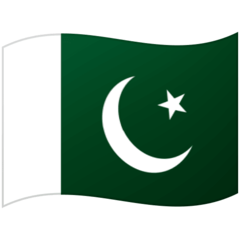

**Pakistan** is a country located in South Asia and is known for its diverse geography, ranging from high mountains to coastal areas. Here is a general geographical description of Pakistan:

1. **Borders and Surroundings**:
Pakistan shares borders with several countries, including India to the east, Afghanistan and Iran to the west, China to the northeast, and the Arabian Sea to the south. The country's strategic location provides it with geopolitical significance.

2. **Mountain Ranges**:
The northern and northwestern regions of Pakistan are dominated by the mighty mountain ranges of the Hindu Kush, Karakoram, and the Himalayas. These ranges are home to some of the world's highest peaks, including K2, the second-highest mountain on Earth. The northern areas, such as Gilgit-Baltistan and Khyber Pakhtunkhwa, are renowned for their stunning natural landscapes and attract adventurers and mountaineers from around the world.

3. **Plateaus and Plains**:
To the south and east of the mountainous regions lie vast plateaus and fertile plains. The Balochistan Plateau covers a significant portion of southwestern Pakistan, characterized by arid deserts, rugged hills, and vast stretches of barren land. The Punjab and Sindh plains are located in the eastern part of the country.

4. **Indus River**:
The mighty Indus River flows through the length of Pakistan, from the mountainous regions in the north to the Arabian Sea in the south.The Indus River Valley is home to some of Pakistan's most populous cities, including **Lahore** and **Karachi**.

5. **Coastal Areas**:
Pakistan has a coastline along the Arabian Sea in the south, spanning approximately 1,050 kilometers. The coastline is characterized by sandy beaches, marshy areas, and mangrove forests. The port city of **Karachi**, located on the coast, is a major economic and industrial hub of the country.

6. **Deserts**:
In addition to the arid regions of **Balochistan**, Pakistan is home to the Thar Desert, located in the southeastern part of the country, near the border with India.

In [213]:
#Code-
Pakistan_loc_df = location_df[location_df['Country'] == 'Pakistan'].dropna(how = 'any')
pak_states = pd.DataFrame(Pakistan_loc_df['State'].value_counts().reset_index())
pak_states.columns= ['State','Atacks']
pak_states = pak_states.head(5)

mask_p = pd.DataFrame(Pakistan_loc_df[['Year','State']].value_counts().reset_index())
mask_p.columns = ['Year','State','Attacks']
list_of_top = ['Balochistan','Sindh','Khyber Pakhtunkhwa','Nort-West Frontier Province',
               'Ghazni','Federally Administered Tribal Areas']
mask_p = mask_p[mask_p.State.isin(list_of_top)]

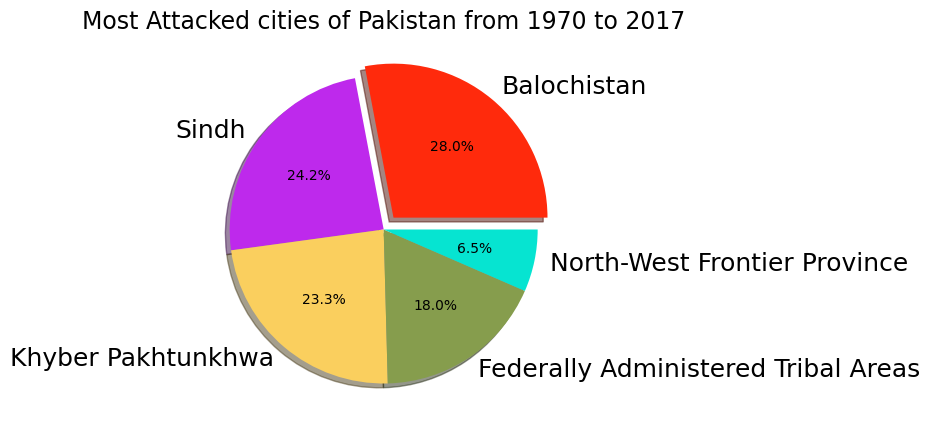

In [214]:
#Visual - 
#Pieplot code - 

plt.figure(figsize=(5,5))
df = pak_states['Atacks']
explode = (0.1, 0,0, 0,0) 
colors = ['#ff2a0c','#be29ec','#facf5e','#869d4d','#06e4d1','#9f8170']
plt.pie(df, labels=pak_states['State'], autopct='%1.1f%%',explode = explode, shadow = True,colors = colors)
plt.title("Most Attacked cities of Pakistan from 1970 to 2017",fontsize=17,color='Black')
plt.show()


### **Visualisation insight** - 
The above Pie plot attempts to provide a visual insight of the different percentage of impact of terrorist activities on different cities of **Pakistan** for the time period **1970 to 2017** - 

From the above plot we can infer - 
1. **Balochistan** with **3710 attacks**, is the most favorable city for terrorist attacks.
2. **Sindh** with **3205 attacks**, ranks second.
3. **Khyber Pakhtunkhwa** with **3084 attacks**, ranks third.
4. **Federally administered Tribal Areas** with **2392 attacks**, ranks fourth.
5. **Nort-West Frontier province** with **866 attacks**, ranks fifth.

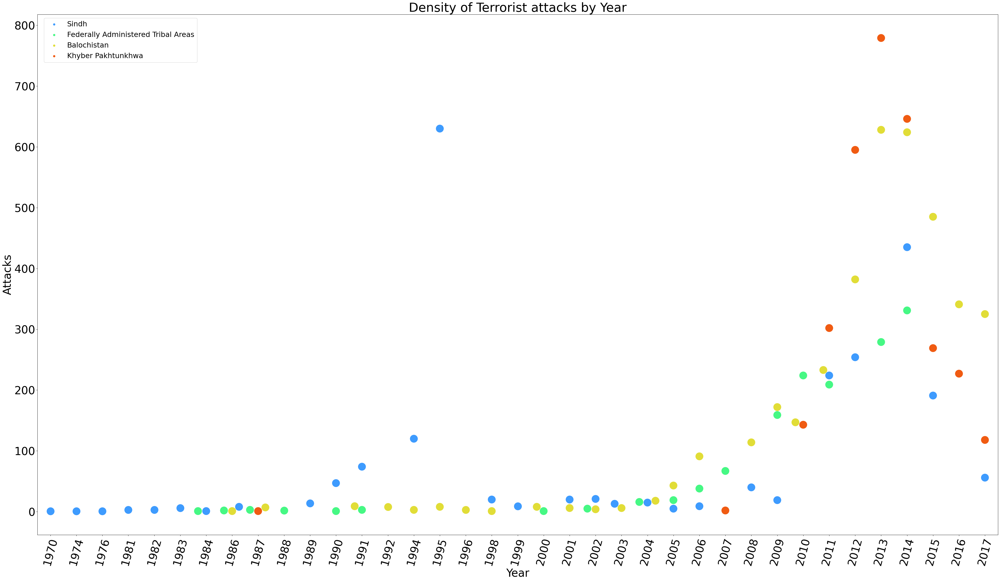

In [215]:
#Visual 2-

#Swarmplot code - 

plt.figure(figsize = (55,30))
sns.swarmplot(data = mask_p.sample(80), x = 'Year',y = 'Attacks', hue = 'State',size =25,palette = 'turbo')
plt.xticks(rotation = 75, fontsize = 35)
plt.yticks(fontsize = 35)
plt.xlabel('Year',fontsize = 35)
plt.ylabel('Attacks',fontsize = 35)
plt.title('Density of Terrorist attacks by Year',fontsize = 40)
plt.legend(bbox_to_anchor = (0.17,1),fontsize = 23)
plt.show()

### **Visualisation insight** -
The above Swarm plot attempts to provide a more detailed visual insight on the terrorist attacks on different cities of **Pakistan** individually for the respective years from 1970 to 2017-

From the above plot we can observe -

1. The terrorist attacks were low and varied only slightly for the years **1970 to 1990**.

2. A spike in terrorist activities were observed from **1991 to 1997** with a peak in **1995** with around **600 attacks.**

3. A significant exponential increase in terrorist activities were recorded since **2006**, with approximately **600 to 800 attacks** happening in between **2012 to 2014**.


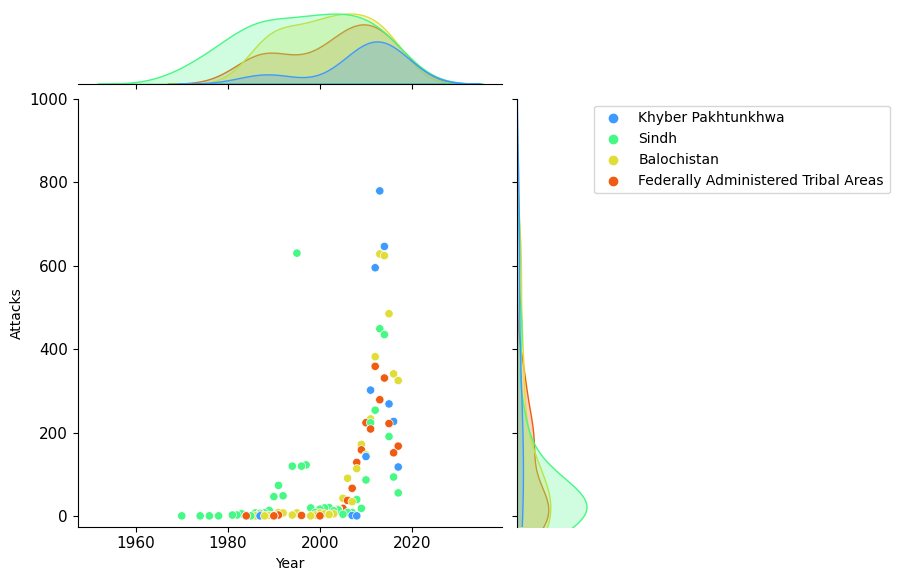

In [216]:
#Visual 3-

#Jointplot code - 

sns.jointplot(data = mask_p,x = 'Year',y = 'Attacks',hue = 'State', palette = 'turbo')
plt.ylim(-25,1000)
plt.legend(bbox_to_anchor = (1.2,1),fontsize =10)
plt.xticks(fontsize = 11)
plt.yticks(fontsize = 11)
plt.show()



### **Visualisation insight -**
The above Joint plot attempts to provide a detailed visual insight on the terrorist attacks on different cities of **Pakistan** individually for the respective years from **1970 to 2017**, the observations are of similar in representation to that of the swarm plot, with an additional Kernel Denstiy Estimation Curve plotted for more visual overview on the distribution of attacks. 

From the above plot we can observe -

1. The terrorist attacks were low and varied only slightly for the years **1970 to 1990**.

2. A spike in terrorist activities were observed from **1991 to 1997** with a peak in **1995** with around **600 attacks**, most attacks were carried out in the **Sindh** province of **Pakistan**

3. **Khyber Pakhtunkhwa** was the recorded the highest overall number of terrorist attacks in **Pakistan** in the year **2013**

4. A significant exponential increase in terrorist activities were recorded since **2006**, with approximately 600 to 800 attacks happening in between **2012 to 2014**, mostly in the **Balochistan** and **Khyber Pakhtunkhwa** regions.

## **3.2.1 Analysis of terrorist activities in Pakistan :**

In [217]:
#Creating custom function to tabulate attack failures - 
def failure_count(num):
    if num == 0:
        return 1
    else:
        return 0

In [218]:
#Code - 
var = gt_df[gt_df['Country'] == 'Pakistan']
attack_group = var[['Year','Month','iday','Success','Group_name']]

attack_group.insert(loc = 4, column = 'Failure',value = attack_group['Success'].apply(failure_count))
overall = pd.pivot_table(data = attack_group,index = 'Group_name',values = ['Success','Failure'],aggfunc = np.sum)
overall['Total_attacks'] = overall['Failure']+overall['Success']
overall['Success_rate'] = round((overall['Success']/overall['Total_attacks'])*100,2)

overall_top10 = overall.nlargest(n = 11, columns= 'Total_attacks')
overall_top10 = overall_top10.drop('Unknown',axis = 0)

overall_top5 = overall_top10.nlargest(5,columns= 'Total_attacks')
top5gang = overall_top5.reset_index()['Group_name']

In [219]:
overall_top10

,Failure,Success,Total_attacks,Success_rate
Group_name,,,,
Tehrik-i-Taliban Pakistan (TTP),80,1255,1335,94.01
Baloch Republican Army (BRA),22,290,312,92.95
Baloch Liberation Front (BLF),19,166,185,89.73
Baloch Liberation Army (BLA),7,174,181,96.13
Muttahida Qami Movement (MQM),7,167,174,95.98
Lashkar-e-Jhangvi,8,127,135,94.07
Lashkar-e-Islam (Pakistan),8,116,124,93.55
Khorasan Chapter of the Islamic State,8,88,96,91.67
United Baloch Army (UBA),3,86,89,96.63


### **DataFrame insight -**

The above DataFrame provides a tabular list of the top 10 terrorist organisations perpeterating the most terrorist attacks in the state of **Pakistan** and their respective success rates - 
1. **Tehrik-i-Taliban Pakistan (TTP)** - **1255** successful attacks with a success rate of **94.01%**

2. **Baloch Republican Army (BRA)** - **290** successful attacks with a success rate of **92.95%**

3. **Baloch Liberation Front (BLF)** - **166** successful attacks with a success rate of **89.73%**

**NOTE** - A large number of labels were indicated as 'Unknown' which either means data is unavailable or the attacks are not being claimed by any terrorist/extremist organisations, these information have been excluded from the analysis.

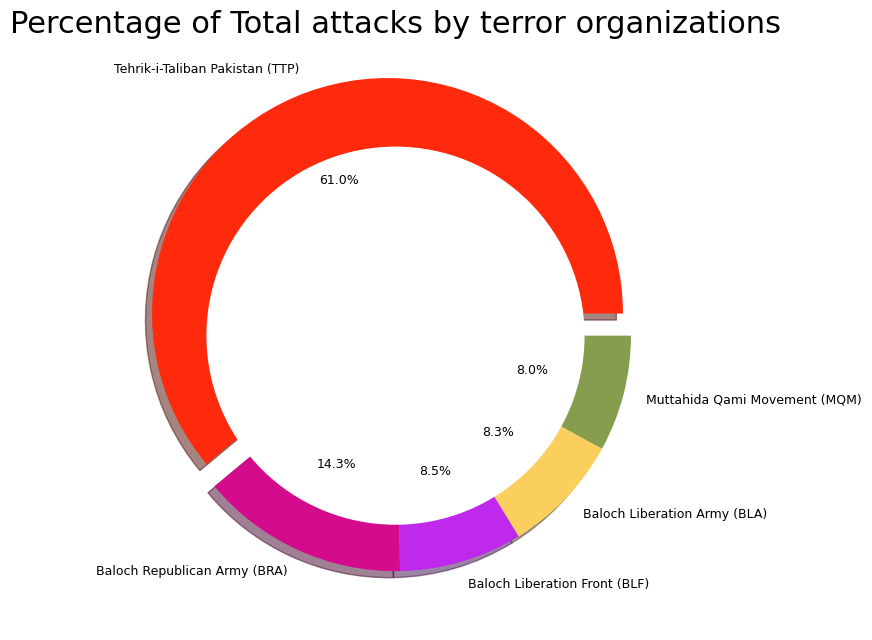

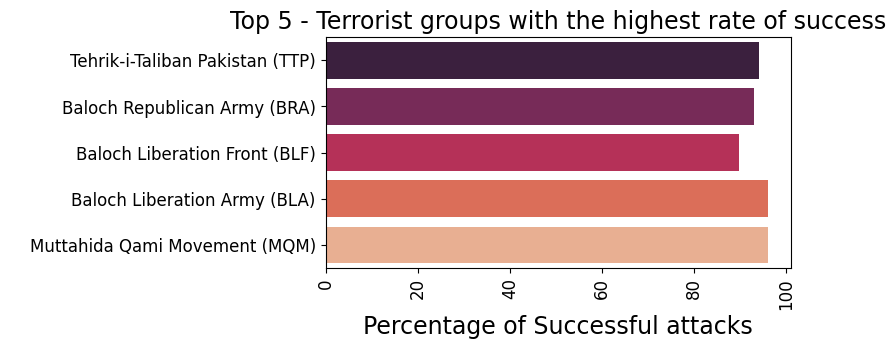

In [220]:
#Visual - 

#Pieplot code - 

df = overall_top5['Total_attacks']
explode = (0.1, 0,0, 0,0) 
colors = ['#ff2a0c','#d40b8d','#be29ec','#facf5e','#869d4d','#06e4d1','#283482','#e6ff05','#e1a28e','#00a898']
plt.pie(df, labels=overall_top5.index, autopct='%1.1f%%',explode = explode, shadow = True,colors = colors, radius = 1,textprops={'fontsize': 9})
my_circle = plt.Circle((0,0),0.8,color='white')
p=plt.gcf().gca().add_artist(my_circle)
plt.rcParams['figure.figsize'] = (17,6)
plt.title("Percentage of Total attacks by terror organizations",fontsize=22,color='Black')
plt.tight_layout()
plt.show()

#Barplot - 
plt.figure(figsize = (6,3))
sns.barplot(data = overall_top5, x = 'Success_rate',y = overall_top5.index, palette = 'rocket')
plt.xticks(rotation = 90, fontsize = 12)
plt.yticks(fontsize = 12)
plt.ylabel(' ')
plt.xlabel('Percentage of Successful attacks', fontsize = 17)
plt.title('Top 5 - Terrorist groups with the highest rate of success', fontsize = 17)
plt.show()


### **Visualisation Insight** - 

The above Donut plot and Bar plot, attempt to provide a visual representation of the most active terrorist organisations and their subsequent success rates respectively for the state of **Pakistan**.

We can observe that -

1. **Tehrik-i-Taliban Pakistan (TTP)** - has carried out **61%** of the total terrorist attacks in Pakistan, with a success rate of **94%**.

2. **Baloch Republican Army (BRA)** - has carried out **14.3%** of the total terrorist attacks in Pakistan, with a success rate of **92.95%**.

3. **Baloch Liberation Front (BLF)** - has carried out **8.5%** of the total terrorist attacks in Pakistan, with a success rate of **89.73%**.

In [221]:
#Code - 

overall2 = pd.pivot_table(data = attack_group,index = ['Group_name','Year'],values = ['Success','Failure'],aggfunc = np.sum)
overall2.reset_index()
overall2.sort_values(by = 'Year',ascending = True, inplace = True)
overall2['Total_attacks'] = overall2['Failure']+overall2['Success']
overall2['Success_rate'] = round((overall2['Success']/overall2['Total_attacks'])*100,2)
overall2.sort_values(by = 'Total_attacks', ascending = False, inplace = True)
overall2 = overall2.reset_index()
overall2 = overall2[overall2['Group_name'].isin(top5gang)]
overall2.sort_values(by = 'Year', ascending = True, inplace = True)

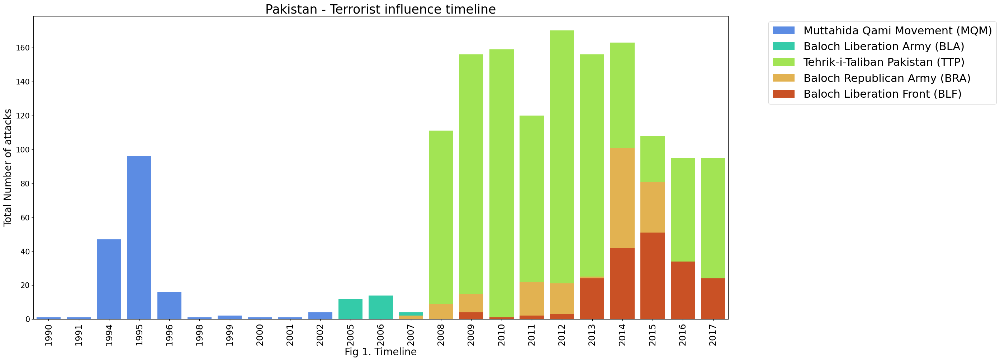

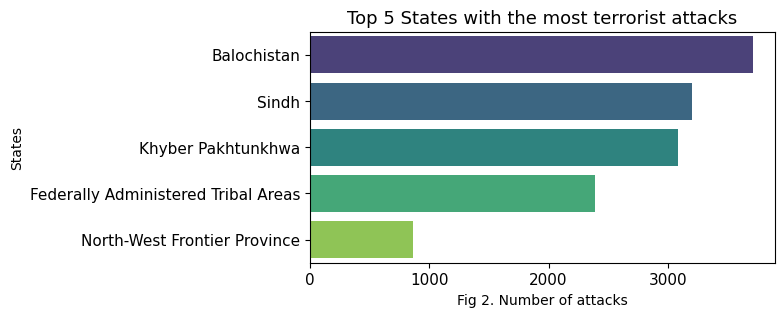

In [222]:
#Visualisation - 

#Barplot code - 
plt.figure(figsize = (25,11))
sns.barplot(data = overall2, x = 'Year',y ='Total_attacks', hue = 'Group_name', dodge = False, palette = 'turbo')
plt.legend(bbox_to_anchor = (1.05,1),fontsize =22)
plt.xticks(rotation = 90)
plt.yticks(fontsize = 15)
plt.title('Pakistan - Terrorist influence timeline',fontsize = 25)
plt.ylabel('Total Number of attacks', fontsize = 20)
plt.xlabel('Fig 1. Timeline',fontsize =20)
plt.show()

#Barplot code - 

plt.figure(figsize = (6,3))
sns.barplot(data = pak_states, x = 'Atacks', y = 'State', palette = 'viridis')

plt.title('Top 5 States with the most terrorist attacks',fontsize = 13)
plt.xlabel('Fig 2. Number of attacks')
plt.ylabel('States')
plt.xticks(fontsize = 11)
plt.yticks(fontsize = 11)

plt.show()

### **Visualisation and section Insight -**
The above Fig 1 and Fig 2 , provides a visual representation of total number of attacks carried out by individual terrorist organisations for the years **1970 to 2017** and most attacked cities for the same time period.

We can observe that -

1. The **Muttahida Qami Movement(MQM)** was the active terrorist group from **1994 to 2002**, They had carried out the most attacks in the year **1995**.
2. The **Baloch Liberation Army** were the active terrorist organisation in the years **2005 - 2006**.
3. The **Tehrik-i-Taliban Pakistan (TTP)** were the most active terrorist organisation from the years **2008 to 2017** carrying about **150 to 180 attacks** every year from **2009 to 2014**.
4. **Tehrik-i-Taliban Pakistan (TTP), Baloch Republican Army (BRA) & Baloch Liberation Front (BLF)** were the active organisations from **2008 to 2017**.

### **3.3. No.3 Most affected Country - Afghanistan** : 

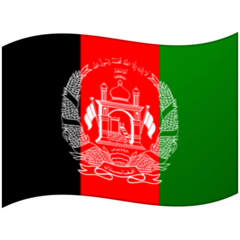

**Afghanistan**, a landlocked country in **Central Asia**, is known for its rugged and diverse geography. Here is a general geographical description of **Afghanistan**:

1.**Borders and Surroundings**:
**Afghanistan** is bordered by several countries, including Iran to the west, Pakistan to the south and east, Turkmenistan, Uzbekistan, and Tajikistan to the north, and China to the northeast. Its location at the crossroads of Central, South, and West Asia has influenced its historical and cultural connections with neighboring regions.

2.**Mountainous Terrain**:
Afghanistan is dominated by rugged mountain ranges, including the Hindu Kush, which runs from east to west throughout the country. The northeastern part of Afghanistan is home to the **Pamir Mountains**. 

3.**Central Highlands**:
The central part of **Afghanistan** consists of high plateaus and rolling hills. Located in the centre the highlands, is relatively less mountainous compared to the northern and eastern parts of the country.

4.**The Hindu Kush Range**:
The Hindu Kush range in Afghanistan is notable for its several high peaks, including **Noshaq**, the country's highest peak. The region is prone to severe winters with heavy snowfall, making it a challenging environment for human habitation and travel.

5.**River Valleys**:
Several major rivers flow through Afghanistan, including the **Amu 
     Darya** in the north, which forms part of the border with Tajikistan, and the **Helmand River** in the southwest.

6.**Deserts**:
In the south and southwest of **Afghanistan**, near the border with **Iran**, lies the **Dasht-e Margo**, also known as the Registan Desert.

7.**Natural Resources**:
**Afghanistan** is known to have significant mineral resources, including deposits of copper, iron ore, gold, lithium, and natural gas. However, exploitation and development of these resources have been hampered by security challenges and limited infrastructure.

In [223]:
#Code-

Afghanistan_loc_df = location_df[location_df['Country'] == 'Afghanistan'].dropna(how = 'any')
afghan_states = pd.DataFrame(Afghanistan_loc_df['State'].value_counts().reset_index())
afghan_states.columns= ['State','Atacks']
afghan_states = afghan_states.head(5)

mask_a = pd.DataFrame(Afghanistan_loc_df[['Year','State']].value_counts().reset_index())
mask_a.columns = ['Year','State','Attacks']
list_of_top = ['Helmand','Kandahar','Nangarhar','Kabul','Ghazni']
mask_a = mask_a[mask_a.State.isin(list_of_top)]


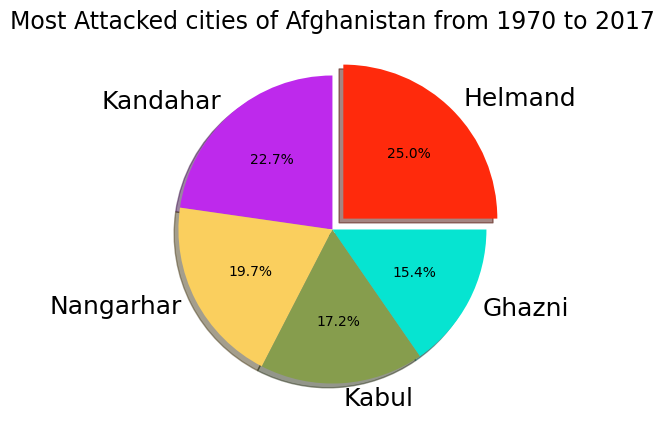

In [224]:
#Visual 1- 
#Pieplot code - 

plt.figure(figsize=(5,5))
df = afghan_states['Atacks']
explode = (0.1, 0,0, 0,0) 
colors = ['#ff2a0c','#be29ec','#facf5e','#869d4d','#06e4d1']
plt.pie(df, labels=afghan_states['State'], autopct='%1.1f%%',explode = explode, shadow = True, colors = colors)
plt.title("Most Attacked cities of Afghanistan from 1970 to 2017",fontsize=17,color='Black')
plt.show()


####  **Visualisation insight -**

The above Pie plot attempts to provide a visual insight of the different percentage of impact of terrorist activities on different cities of Afghanistan for the time period **1970 to 2017 -**

From the above plot we can infer -

1. **Helmand** with 1234 attacks, is the most favorable city for terrorist attacks.
2. **Kandahar** with 1122 attacks, ranks second.
3. **Nangarhar** with 972 attacks, ranks third.
4. **Kabul** with 849 attacks is the fourth most prominent target for terrorists.

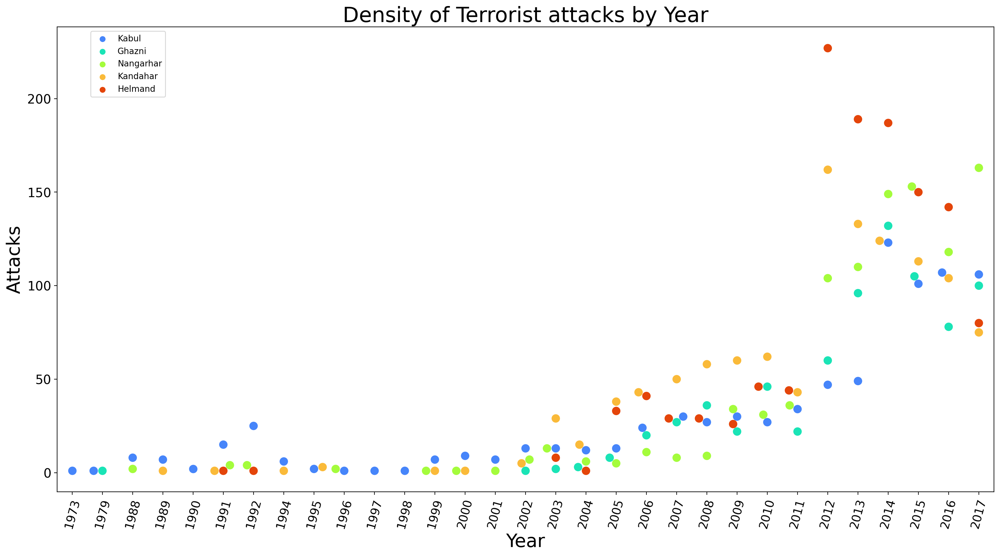

In [225]:
#Visual 2-
#Swarmplot code - 
plt.figure(figsize = (20,10), dpi = 200)
sns.swarmplot(data = mask_a, x = 'Year',y = 'Attacks', hue = 'State',size = 10,palette = 'turbo')
plt.xticks(rotation = 75, fontsize = 14)
plt.yticks(fontsize = 15)
plt.xlabel('Year',fontsize = 22)
plt.ylabel('Attacks',fontsize = 22)
plt.title('Density of Terrorist attacks by Year',fontsize = 25)
plt.legend(bbox_to_anchor = (0.12,1))
plt.show()

### **Visualisation insight -**
The above Swarm plot attempts to provide a more detailed visual insight on the terrorist attacks on different cities of Afghanistan individually for the respective years from 1970 to 2017-

From the above plot we can observe -

1. The terrorist attacks were low and varied only slightly for the years 1970 to 1990.

2. A slight spike in terrorist activities were observed for the years 1991 and 1992 with almost 50 attacks occuring in both the years.

3. A significant exponential increase in terrorist activities were recorded since 2002, with approximately 200 attacks happening every year between 2012 to 2014.

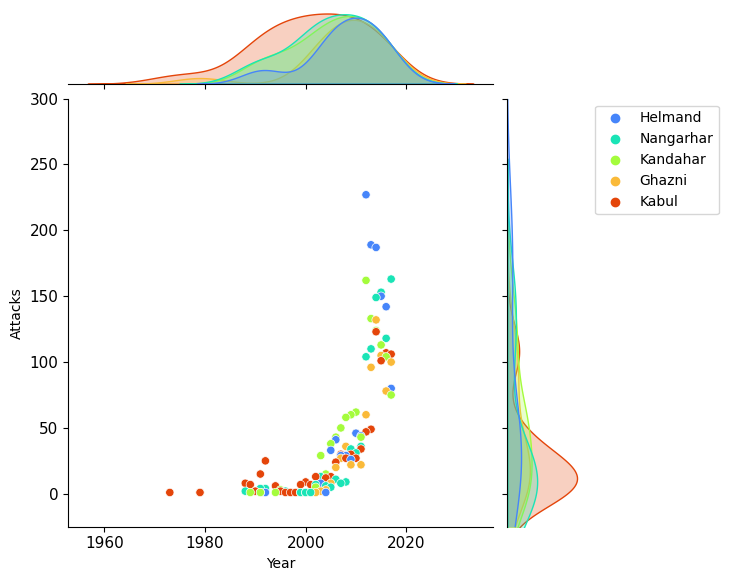

In [226]:
#Visual 3-
#Jointplot code - 

sns.jointplot(data = mask_a,x = 'Year',y = 'Attacks',hue = 'State',palette = 'turbo')
plt.ylim(-25,300)
plt.legend(bbox_to_anchor = (1.55,1),fontsize =10)
plt.xticks(fontsize = 11)
plt.yticks(fontsize = 11)
plt.show()



#### **Visualisation insight -**

The above Joint plot attempts to provide a detailed visual insight on the terrorist attacks on different cities of Afghanistan individually for the respective years from 1970 to 2017, the observations are of similar nature in representation to that of the swarm plot, with an additional Kernel Denstiy Estimation Curve plotted for more visual overview on the distribution of attacks.

From the above plot we can observe -

1. The terrorist attacks were low and varied only slightly for the years 1970 to 1990.

2. A slight spike in terrorist activities were observed for the years 1991 and 1992 with almost 50 attacks occuring in both the years. Most of the attacks were recorded in the **Kabul** region of Afghanistan.

3. A significant exponential increase in terrorist activities were recorded since 2002, with approximately 200 attacks happening every year between 2012 to 2014, these attacks were mostly observed in the **Helmand** region of Afghanistan.

#### **3.3.1 Analysis of terrorist activities in Afghanistan :**

In [227]:
#Creating custom function to tabulate attack failures - 
def failure_count(num):
    if num == 0:
        return 1
    else:
        return 0

In [228]:
#Code - 
var = gt_df[gt_df['Country'] == 'Afghanistan']
attack_group = var[['Year','Month','iday','Success','Group_name']]

attack_group.insert(loc = 4, column = 'Failure',value = attack_group['Success'].apply(failure_count))
overall = pd.pivot_table(data = attack_group,index = 'Group_name',values = ['Success','Failure'],aggfunc = np.sum)
overall['Total_attacks'] = overall['Failure']+overall['Success']
overall['Success_rate'] = round((overall['Success']/overall['Total_attacks'])*100,2)

overall_top10 = overall.nlargest(n = 11, columns= 'Total_attacks')
overall_top10 = overall_top10.drop('Unknown',axis = 0)

overall_top5 = overall_top10.nlargest(4,columns= 'Total_attacks')
top5gang = overall_top5.reset_index()['Group_name']

In [229]:
overall_top10

,Failure,Success,Total_attacks,Success_rate
Group_name,,,,
Taliban,794,6629,7423,89.30
Khorasan Chapter of the Islamic State,42,200,242,82.64
Haqqani Network,18,66,84,78.57
Hizb-I-Islami,1,41,42,97.62
Al-Qaida,3,17,20,85.00
Tehrik-i-Taliban Pakistan (TTP),3,12,15,80.00
Gunmen,2,7,9,77.78
Afghan Guerrillas,0,7,7,100.00
Afghan Mujahideen,1,6,7,85.71


#### **DataFrame insight -**
The above DataFrame provides a tabular list of the top 10 terrorist organisations perpeterating the most terrorist attacks in Afghanistan and their respective success rates -

1.**Taliban** - Has the Highest influence in Afghanistan with over 6629 successful attacks with a success rate of 89.3%

2.**Khorasan Chapter of the Islamic State** - 200 successful attacks with a success rate of 82.64%

3.**Haqqani Network** - 66 successful attacks with a success rate of 78.57%

NOTE - A large number of labels were indicated as 'Unknown' which either means data is unavailable or the attacks are not being claimed by any terrorist/extremist organisations, these information have been excluded from the analysis.

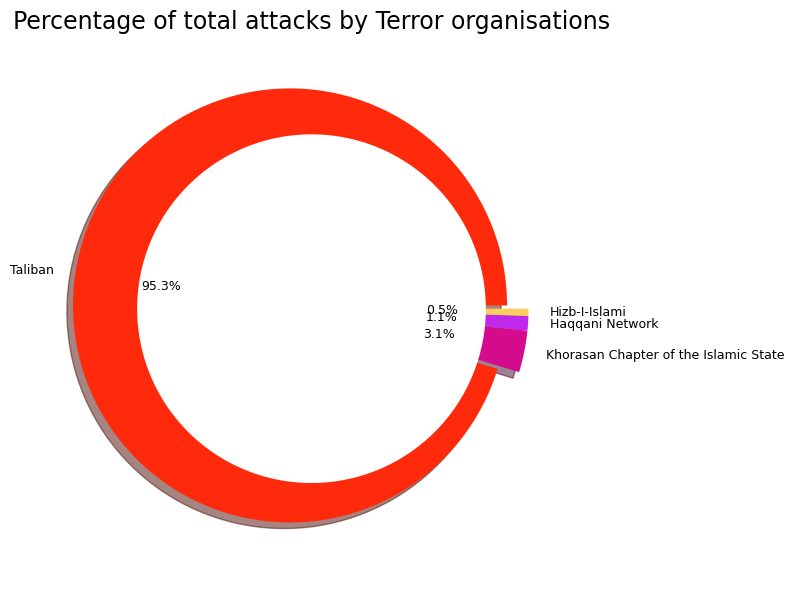

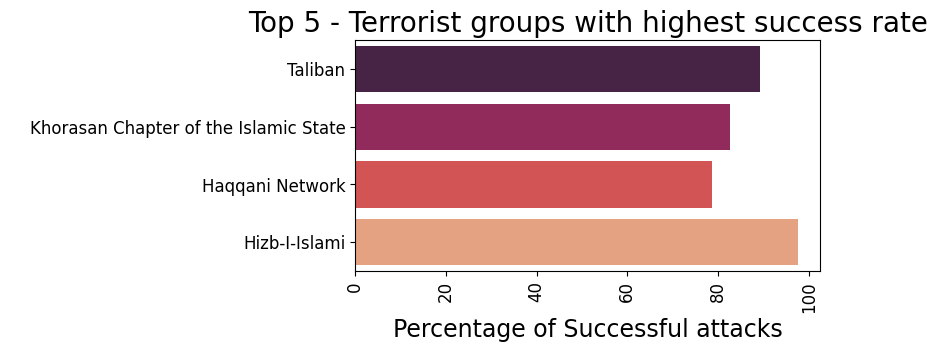

In [230]:
#Visual - 

#Pieplot code - 

df = overall_top5['Total_attacks']
explode = (0.1, 0,0, 0) 
colors = ['#ff2a0c','#d40b8d','#be29ec','#facf5e','#869d4d','#06e4d1','#283482','#e6ff05','#e1a28e','#00a898']
plt.pie(df, labels=overall_top5.index, autopct='%1.1f%%',explode = explode, shadow = True,colors = colors, radius = 1,textprops={'fontsize': 9})
my_circle = plt.Circle((0,0),0.8,color='white')
p=plt.gcf().gca().add_artist(my_circle)
plt.rcParams['figure.figsize'] = (17,7)
plt.title("Percentage of total attacks by Terror organisations",fontsize=17,color='Black')
plt.tight_layout()
plt.show()

#Barplot - 
plt.figure(figsize = (6,3))
sns.barplot(data = overall_top5, x = 'Success_rate',y = overall_top5.index, palette = 'rocket')
plt.xticks(rotation = 90, fontsize = 12)
plt.yticks(fontsize = 12)
plt.ylabel(' ')
plt.xlabel('Percentage of Successful attacks', fontsize = 17)
plt.title('Top 5 - Terrorist groups with highest success rate', fontsize = 20)
plt.show()

#### **Visualisation Insight -**

The above Donut plot and Bar plot, attempt to provide a visual representation of the most active terrorist organisations and their subsequent success rates respectively for the country of Afghanistan.

We can observe that -

**Taliban** - has carried out 95.3% of the total terrorist attacks in Afghanistan, with a success rate of 89.3%.

**Khorasan Chapter of the Islamic State** - has carried out 3.1% of the total terrorist attacks in Afghanistan, with a success rate of 82.64%.

**Haqqani Network** - has carried out 1.1% of the total terrorist attacks in Pakistan, with a success rate of 78.57%.

In [231]:
#Code - 

overall2 = pd.pivot_table(data = attack_group,index = ['Group_name','Year'],values = ['Success','Failure'],aggfunc = np.sum)
overall2.reset_index()
overall2.sort_values(by = 'Year',ascending = True, inplace = True)
overall2['Total_attacks'] = overall2['Failure']+overall2['Success']
overall2['Success_rate'] = round((overall2['Success']/overall2['Total_attacks'])*100,2)
overall2.sort_values(by = 'Total_attacks', ascending = False, inplace = True)
overall2 = overall2.reset_index()
overall2 = overall2[overall2['Group_name'].isin(top5gang)]
overall2.sort_values(by = 'Year', ascending = True, inplace = True)

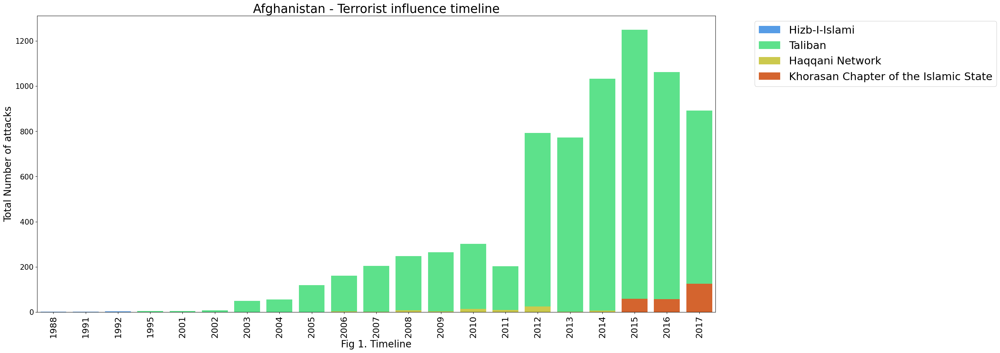

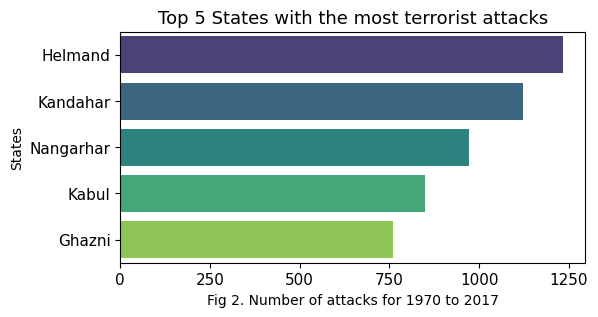

In [232]:
#Visualisation - 
#Barplot code - 
plt.figure(figsize = (25,11))
sns.barplot(data = overall2, x = 'Year',y ='Total_attacks', hue = 'Group_name', dodge = False, palette = 'turbo')
plt.legend(bbox_to_anchor = (1.05,1),fontsize =22)
plt.xticks(rotation = 90)
plt.yticks(fontsize = 15)
plt.title('Afghanistan - Terrorist influence timeline',fontsize = 25)
plt.ylabel('Total Number of attacks', fontsize = 20)
plt.xlabel('Fig 1. Timeline',fontsize =20)
plt.show()

#Barplot code - 

plt.figure(figsize = (6,3))
sns.barplot(data = afghan_states, x = 'Atacks', y = 'State', palette = 'viridis')

plt.title('Top 5 States with the most terrorist attacks', fontsize = 13)
plt.xlabel('Fig 2. Number of attacks for 1970 to 2017')
plt.ylabel('States')
plt.xticks(fontsize = 11)
plt.yticks(fontsize = 11)

plt.show()

#### **Visualisation and section Insight -**
The above Fig 1 and Fig 2 , provides a visual representation of total number of attacks carried out by individual terrorist organisations for the years 1970 to 2017 and most attacked cities for the same time period.

We can observe that -

1. Terrorism started taking prominence since 2003 with about 50 to 100 attacks every year.
2. There is an exponential increase of terrorist activities in Afghanistan since 2005 and almost all of the attacks were perpeterated by the Taliban.
3. The highest number of attacks were carried out by the Taliban in the years 2014 to 2016 with attacks exceeding 1000 every year.
4. We can also observe the entrant of **Khorasan Chapter of the Islamic State** into Afghanistan from 2015 and are seen to be increasing the number of attacks.
5. Helmand, Kandahar and Nangarhar were the most affected cities due to the terrorist attacks.  

### **4.Terror distribution across the globe -**

#### **4.1.World Map showing distribution of Terror strikes :**

In [233]:
#Code-
#Using Plotly Geo-Scatter plot - 
fig = px.scatter_geo(location_df,lat='latitude',lon='longitude',hover_name="Country",color="Region")
fig.update_geos(projection_type="orthographic")
fig.update_layout(title='World wide Terrorist Attacked Regions (1970-2017)',title_x=0.5)
fig.update_layout(height=350, margin={"r":0,"t":35,"l":0,"b":0})
fig.show()

#### **Visualisation Insight -**

The above Geo Scatter plot shows a scatter plot based on the Geo tags of the individual attacks plotted on the globe of the Earth.

This plot provides a clear understanding of the reach of terror activities across all continents of the Earth and also gives us an idea of the number of attacks that have been committed over time. 


### **4.2.Number of Terror Attacks in Different Countries from 1970-2014:** 

In [234]:
#Code - 
#Using Plotly Choropleth -

attacks_time_lapse = pd.DataFrame(gt_df.groupby(["Year" , "Country"])["Year"].count() , 
                                  columns = ["Year"]).rename(columns = {"Year" : "attacks"}).reset_index()

attacks_time_lapse_choropleth = px.choropleth(attacks_time_lapse , locations = "Country" , locationmode = "country names" , 
              color = "attacks" , animation_group = "attacks" , 
              animation_frame = "Year" , labels={"attacks" : "Number of Attacks"} ,
              title = "Number of Terror Attacks in Different Countries from 1970-2014")
attacks_time_lapse_choropleth.show()

#### **Visualisation Insight -**
The above Chloropleth plot shows the chronological insight on the number of terrorist attacks committed across different continents of the Earth for every year in the time period **1970 to 2017**. 

It provides as a good visual aide by highlighting the regions where terror activities have occurred for the respective year. 

It also color codes different regions based on the number of attacks as indicated in the legend bar.